# <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:balck; font-size:190%; text-align:left;padding: 0px; border-bottom: 3px solid red">ISIC 2024 Skin Cancer Detection EDA & Image Processing & Model Tranning</p>

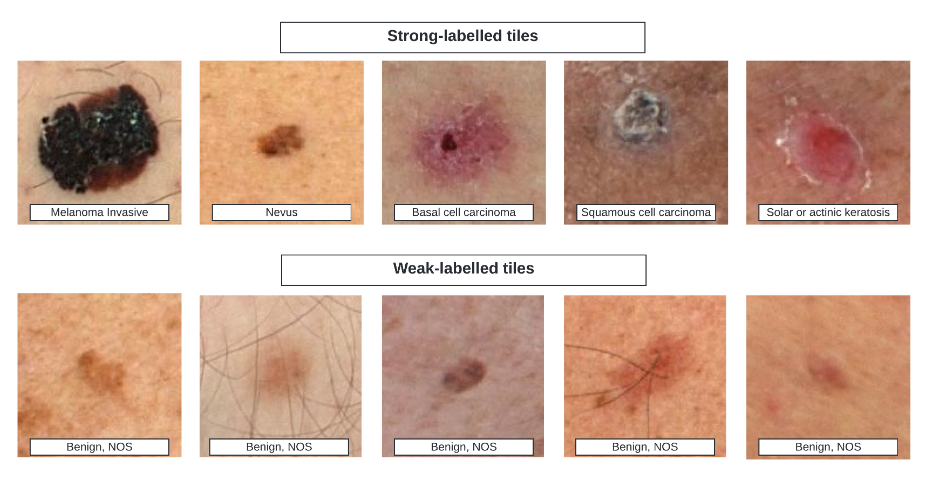

# <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:balck; font-size:150%; text-align:left;padding: 0px; border-bottom: 3px solid red">EDA - Exploratory data analysis Part</p>

1. **What is Exploratory Data Analysis (EDA)?**
Exploratory Data Analysis (EDA) is an approach to analyzing datasets to summarize their main characteristics, often with visual methods. It involves various techniques to understand the underlying patterns, spot anomalies, test assumptions, and check the validity of statistical models. EDA is crucial for guiding subsequent analyses and modeling efforts.

2. **Key Aspects of EDA**
* Distribution of Data: Understanding the distribution of data points helps to grasp the range, central tendencies (mean, median), and dispersion (variance, standard deviation) of the dataset.

* Graphical Representations: Charts such as histograms, box plots, scatter plots, and bar charts are used to visualize data distributions and relationships between variables.

* Outlier Detection: Identifying and understanding outliers—values significantly different from others—helps in assessing data quality and uncovering unique cases or errors.

* Correlation Analysis: Examining the relationships between variables using correlation coefficients and correlation matrices to understand how variables might influence each other.

* Handling Missing Values: Detecting and addressing missing data points through imputation or removal to maintain data integrity and analysis reliability.

* Summary Statistics: Calculating essential statistics such as mean, median, mode, standard deviation, skewness, and kurtosis to gain insights into data trends and variability.

* Testing Assumptions: Verifying assumptions (e.g., normality, homoscedasticity) underlying statistical tests and models to ensure valid analysis outcomes.

# <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:black; font-size:130%; text-align:left;padding: 0px; border-bottom: 3px solid red">Libraries</p>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import os

# **Import and Inspect the Data**

In [2]:
# Load the datasets
train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')
test_df = pd.read_csv('/kaggle/input/isic-2024-challenge/test-metadata.csv')


/tmp/ipykernel_36/3591018348.py:2: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')


> **The code reads and loads the training and testing datasets from CSV files into pandas DataFrames named train_df and test_df, respectively.****

In [3]:
print("Train Data Sample:")
print(train_df.head())

Train Data Sample:
        isic_id  target  patient_id  age_approx   sex anatom_site_general  \
0  ISIC_0015670       0  IP_1235828        60.0  male     lower extremity   
1  ISIC_0015845       0  IP_8170065        60.0  male           head/neck   
2  ISIC_0015864       0  IP_6724798        60.0  male     posterior torso   
3  ISIC_0015902       0  IP_4111386        65.0  male      anterior torso   
4  ISIC_0024200       0  IP_8313778        55.0  male      anterior torso   

   clin_size_long_diam_mm          image_type tbp_tile_type   tbp_lv_A  ...  \
0                    3.04  TBP tile: close-up     3D: white  20.244422  ...   
1                    1.10  TBP tile: close-up     3D: white  31.712570  ...   
2                    3.40  TBP tile: close-up        3D: XP  22.575830  ...   
3                    3.22  TBP tile: close-up        3D: XP  14.242329  ...   
4                    2.73  TBP tile: close-up     3D: white  24.725520  ...   

    lesion_id  iddx_full  iddx_1  iddx_2  i

> **The code prints the first few rows of the train_df DataFrame to display a sample of the training data.****

In [4]:
print('The number of samples in the train data is {}.'.format(train_df.shape[0]))

The number of samples in the train data is 401059.


In [5]:
print("\nTest DataFrame:")
print(test_df.head())


Test DataFrame:
        isic_id  patient_id  age_approx     sex anatom_site_general  \
0  ISIC_0015657  IP_6074337        45.0    male     posterior torso   
1  ISIC_0015729  IP_1664139        35.0  female     lower extremity   
2  ISIC_0015740  IP_7142616        65.0    male     posterior torso   

   clin_size_long_diam_mm          image_type tbp_tile_type  tbp_lv_A  \
0                    2.70  TBP tile: close-up        3D: XP  22.80433   
1                    2.52  TBP tile: close-up        3D: XP  16.64867   
2                    3.16  TBP tile: close-up        3D: XP  24.25384   

   tbp_lv_Aext  ...  tbp_lv_radial_color_std_max  tbp_lv_stdL  tbp_lv_stdLExt  \
0    20.007270  ...                     0.304827     1.281532        2.299935   
1     9.657964  ...                     0.000000     1.271940        2.011223   
2    19.937380  ...                     0.230742     1.080308        2.705857   

   tbp_lv_symm_2axis  tbp_lv_symm_2axis_angle   tbp_lv_x     tbp_lv_y  \
0      

In [6]:
print('The number of samples in the train data is {}.'.format(test_df.shape[0]))

The number of samples in the train data is 3.


In [7]:
# Check the structure and summary of the datasets
print("\nTrain DataFrame Info:")
print(train_df.info())

print("\nTest DataFrame Info:")
print(test_df.info())


Train DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401059 entries, 0 to 401058
Data columns (total 55 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   isic_id                       401059 non-null  object 
 1   target                        401059 non-null  int64  
 2   patient_id                    401059 non-null  object 
 3   age_approx                    398261 non-null  float64
 4   sex                           389542 non-null  object 
 5   anatom_site_general           395303 non-null  object 
 6   clin_size_long_diam_mm        401059 non-null  float64
 7   image_type                    401059 non-null  object 
 8   tbp_tile_type                 401059 non-null  object 
 9   tbp_lv_A                      401059 non-null  float64
 10  tbp_lv_Aext                   401059 non-null  float64
 11  tbp_lv_B                      401059 non-null  float64
 12  tbp_lv_Bext          

> **The code prints the summary information of both train_df and test_df DataFrames, including data types and missing values.**

In [8]:
print("\nTrain Data Description:")
train_df.describe()

print("\nTest Data Description:")
test_df.describe()


Train Data Description:

Test Data Description:


,age_approx,clin_size_long_diam_mm,tbp_lv_A,tbp_lv_Aext,tbp_lv_B,tbp_lv_Bext,tbp_lv_C,tbp_lv_Cext,tbp_lv_H,tbp_lv_Hext,...,tbp_lv_norm_color,tbp_lv_perimeterMM,tbp_lv_radial_color_std_max,tbp_lv_stdL,tbp_lv_stdLExt,tbp_lv_symm_2axis,tbp_lv_symm_2axis_angle,tbp_lv_x,tbp_lv_y,tbp_lv_z
count,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,...,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
mean,48.333333,2.793333,21.235613,16.534205,30.055107,27.650733,36.939135,32.498746,54.900061,59.695153,...,0.621704,7.952809,0.178523,1.211260,2.339005,0.423880,51.666667,-117.242387,1148.245296,23.461588
std,15.275252,0.330051,4.037983,5.955101,1.508777,0.679182,1.795292,2.930254,6.153928,9.525959,...,0.578214,1.531253,0.158981,0.113509,0.348961,0.056670,50.579970,35.636913,461.012045,78.683844
min,35.000000,2.520000,16.648670,9.657964,28.384120,27.043640,35.467806,29.169579,51.220960,53.505430,...,0.000000,6.340311,0.000000,1.080308,2.011223,0.366071,20.000000,-155.065100,629.535889,-28.576050
25%,40.000000,2.610000,19.726500,14.797672,29.423900,27.283979,35.938953,31.404790,51.347845,54.210420,...,0.360870,7.235590,0.115371,1.176124,2.155579,0.396150,22.500000,-133.717170,966.756944,-21.797669
50%,45.000000,2.700000,22.804330,19.937380,30.463680,27.524318,36.410100,33.640000,51.474730,54.915410,...,0.721739,8.130868,0.230742,1.271940,2.299935,0.426230,25.000000,-112.369240,1303.978000,-15.019287
75%,55.000000,2.930000,23.529085,19.972325,30.890600,27.954279,37.674800,34.163330,56.739612,62.790014,...,0.932557,8.759058,0.267784,1.276736,2.502896,0.452784,67.500000,-98.331030,1407.600000,49.480406
max,65.000000,3.160000,24.253840,20.007270,31.317520,28.384240,38.939500,34.686660,62.004494,70.664619,...,1.143374,9.387248,0.304827,1.281532,2.705857,0.479339,110.000000,-84.292820,1511.222000,113.980100


> **The code prints descriptive statistics for the train_df and test_df DataFrames, providing summaries of numerical columns such as count, mean, standard deviation, minimum, and maximum values.**

In [9]:
print("Columns in the training dataset:")
train_df.columns

Columns in the training dataset:


Index(['isic_id', 'target', 'patient_id', 'age_approx', 'sex',
       'anatom_site_general', 'clin_size_long_diam_mm', 'image_type',
       'tbp_tile_type', 'tbp_lv_A', 'tbp_lv_Aext', 'tbp_lv_B', 'tbp_lv_Bext',
       'tbp_lv_C', 'tbp_lv_Cext', 'tbp_lv_H', 'tbp_lv_Hext', 'tbp_lv_L',
       'tbp_lv_Lext', 'tbp_lv_areaMM2', 'tbp_lv_area_perim_ratio',
       'tbp_lv_color_std_mean', 'tbp_lv_deltaA', 'tbp_lv_deltaB',
       'tbp_lv_deltaL', 'tbp_lv_deltaLB', 'tbp_lv_deltaLBnorm',
       'tbp_lv_eccentricity', 'tbp_lv_location', 'tbp_lv_location_simple',
       'tbp_lv_minorAxisMM', 'tbp_lv_nevi_confidence', 'tbp_lv_norm_border',
       'tbp_lv_norm_color', 'tbp_lv_perimeterMM',
       'tbp_lv_radial_color_std_max', 'tbp_lv_stdL', 'tbp_lv_stdLExt',
       'tbp_lv_symm_2axis', 'tbp_lv_symm_2axis_angle', 'tbp_lv_x', 'tbp_lv_y',
       'tbp_lv_z', 'attribution', 'copyright_license', 'lesion_id',
       'iddx_full', 'iddx_1', 'iddx_2', 'iddx_3', 'iddx_4', 'iddx_5',
       'mel_mitotic_index', '

# **Calculating Mean and Median for Specific Columns**

In [10]:
import pandas as pd

# Load datasets
train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv', low_memory=False)
test_df = pd.read_csv('/kaggle/input/isic-2024-challenge/test-metadata.csv', low_memory=False)

# Specify the columns for which you want to calculate mean and median
columns_of_interest = ['age_approx', 'tbp_lv_areaMM2', 'tbp_lv_dnn_lesion_confidence']

# Check for missing columns in both train and test datasets
missing_columns_train = [col for col in columns_of_interest if col not in train_df.columns]
missing_columns_test = [col for col in columns_of_interest if col not in test_df.columns]

# Print missing columns if any
if missing_columns_train:
    print(f"Missing columns in train dataset: {missing_columns_train}")
if missing_columns_test:
    print(f"Missing columns in test dataset: {missing_columns_test}")

# Filter columns of interest that are present in both datasets
filtered_columns_train = [col for col in columns_of_interest if col in train_df.columns]
filtered_columns_test = [col for col in columns_of_interest if col in test_df.columns]

# Calculate mean and median for the selected columns in train dataset
mean_train = train_df[filtered_columns_train].mean()
median_train = train_df[filtered_columns_train].median()

# Calculate mean and median for the selected columns in test dataset
mean_test = test_df[filtered_columns_test].mean()
median_test = test_df[filtered_columns_test].median()

# Display the results
print("Mean (Train Dataset):\n", mean_train)
print("\nMedian (Train Dataset):\n", median_train)
print("\nMean (Test Dataset):\n", mean_test)
print("\nMedian (Test Dataset):\n", median_test)


Missing columns in test dataset: ['tbp_lv_dnn_lesion_confidence']
Mean (Train Dataset):
 age_approx                      58.012986
tbp_lv_areaMM2                   8.539975
tbp_lv_dnn_lesion_confidence    97.162204
dtype: float64

Median (Train Dataset):
 age_approx                      60.000000
tbp_lv_areaMM2                   5.685870
tbp_lv_dnn_lesion_confidence    99.994588
dtype: float64

Mean (Test Dataset):
 age_approx        48.333333
tbp_lv_areaMM2     3.121286
dtype: float64

Median (Test Dataset):
 age_approx        45.00000
tbp_lv_areaMM2     3.39651
dtype: float64


# **Check for duplicate**

In [11]:
duplicates = test_df.duplicated().sum()
print(f'Number of duplicate records in the testing dataset: {duplicates}')

Number of duplicate records in the testing dataset: 0


> **Missing Columns: The code first checks if the specified columns exist in both the training and test datasets. If any columns are missing, it prints the names of those missing columns.
> Mean and Median Calculation: The code then calculates the mean and median for the selected columns that are present in both datasets.
> Result Display: Finally, it prints the mean and median values for each selected column in both the training and test datasets.**

In [12]:
# Check for duplicate records in the training dataset
duplicates = train_df.duplicated().sum()
print(f'Number of duplicate records in the training dataset: {duplicates}')

Number of duplicate records in the training dataset: 0


> **The code counts and prints the number of duplicate records in the train_df DataFrame.**

# **Check Missing Data**

In [13]:
# Check for missing values in each column
missing_values = train_df.isnull().sum()
print("Missing values in each column:")
print(missing_values)

# Calculate the percentage of missing values for each column
percent_missing = (missing_values / train_df.shape[0]) * 100
print("\nPercentage of missing values in each column:")
print(percent_missing)

Missing values in each column:
isic_id                              0
target                               0
patient_id                           0
age_approx                        2798
sex                              11517
anatom_site_general               5756
clin_size_long_diam_mm               0
image_type                           0
tbp_tile_type                        0
tbp_lv_A                             0
tbp_lv_Aext                          0
tbp_lv_B                             0
tbp_lv_Bext                          0
tbp_lv_C                             0
tbp_lv_Cext                          0
tbp_lv_H                             0
tbp_lv_Hext                          0
tbp_lv_L                             0
tbp_lv_Lext                          0
tbp_lv_areaMM2                       0
tbp_lv_area_perim_ratio              0
tbp_lv_color_std_mean                0
tbp_lv_deltaA                        0
tbp_lv_deltaB                        0
tbp_lv_deltaL                    

> **he code calculates and prints the number of missing values and the percentage of missing values for each column in the train_df DataFrame.**

# **Percentage of Missing Values by Column Plot Show**

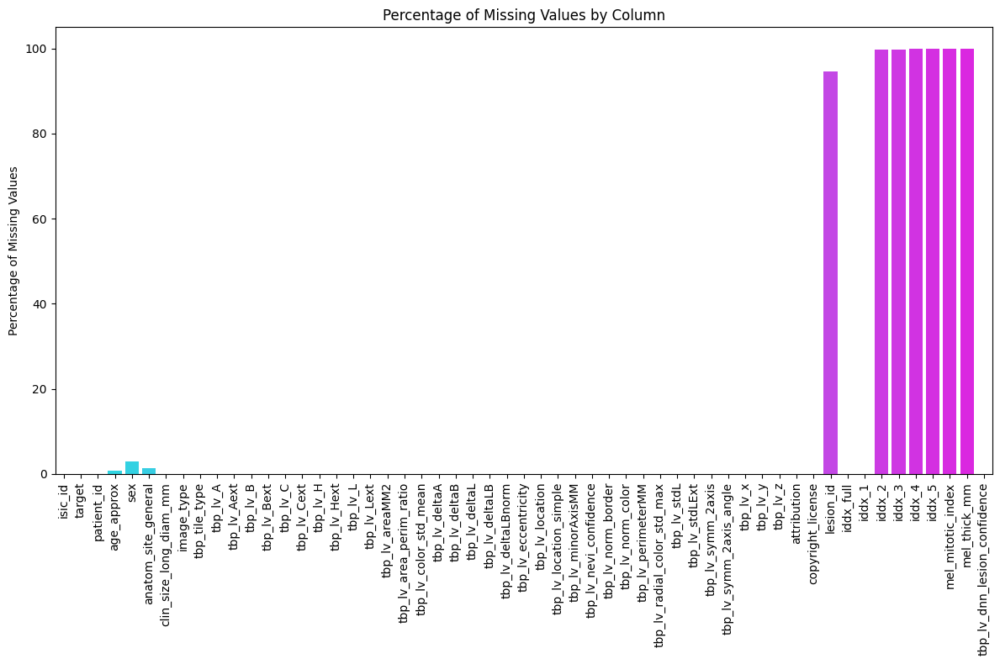

In [14]:
# Visualize the percentage of missing values
plt.figure(figsize=(12, 8))
sns.barplot(x=percent_missing.index, y=percent_missing.values, palette='cool')

# Customize the plot
plt.xticks(rotation=90)
plt.ylabel('Percentage of Missing Values')
plt.title('Percentage of Missing Values by Column')
plt.tight_layout()

# Show the plot
plt.show()

# Check Unique Values In train dataframe

In [15]:
# Check the number of unique values in each column for the training dataset
print("Unique Values in Train Data:")
print(train_df.nunique())

# Check the number of unique values in each column for the test dataset
print("\nUnique Values in Test Data:")
print(test_df.nunique())

Unique Values in Train Data:
isic_id                         401059
target                               2
patient_id                        1042
age_approx                          16
sex                                  2
anatom_site_general                  5
clin_size_long_diam_mm            1758
image_type                           1
tbp_tile_type                        2
tbp_lv_A                        386052
tbp_lv_Aext                     385304
tbp_lv_B                        389890
tbp_lv_Bext                     387763
tbp_lv_C                        390703
tbp_lv_Cext                     388865
tbp_lv_H                        389798
tbp_lv_Hext                     390743
tbp_lv_L                        395726
tbp_lv_Lext                     396358
tbp_lv_areaMM2                    8029
tbp_lv_area_perim_ratio         167648
tbp_lv_color_std_mean           371189
tbp_lv_deltaA                   398257
tbp_lv_deltaB                   398886
tbp_lv_deltaL                   396

> **The code prints the number of unique values in each column for both the train_df and test_df DataFrames.**

# **Explore Data Characteristics**

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


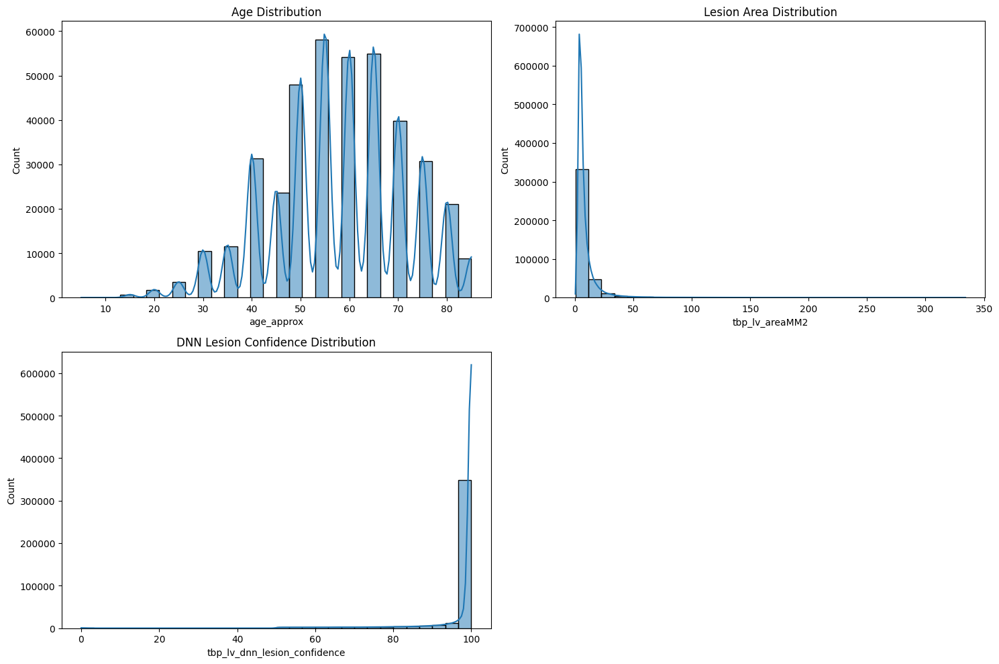

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 10))

# Histogram for age
plt.subplot(2, 2, 1)
sns.histplot(train_df['age_approx'].dropna(), kde=True, bins=30)
plt.title('Age Distribution')

# Histogram for lesion size
plt.subplot(2, 2, 2)
sns.histplot(train_df['tbp_lv_areaMM2'].dropna(), kde=True, bins=30)
plt.title('Lesion Area Distribution')

# Histogram for DNN lesion confidence
plt.subplot(2, 2, 3)
sns.histplot(train_df['tbp_lv_dnn_lesion_confidence'].dropna(), kde=True, bins=30)
plt.title('DNN Lesion Confidence Distribution')

plt.tight_layout()
plt.show()


> **The code provides summary statistics for all columns in the train_df DataFrame and visualizes the distributions of key variables, specifically age_approx and the target variable, using histogram and count plot visualizations.**

# **Count Target by Gender**

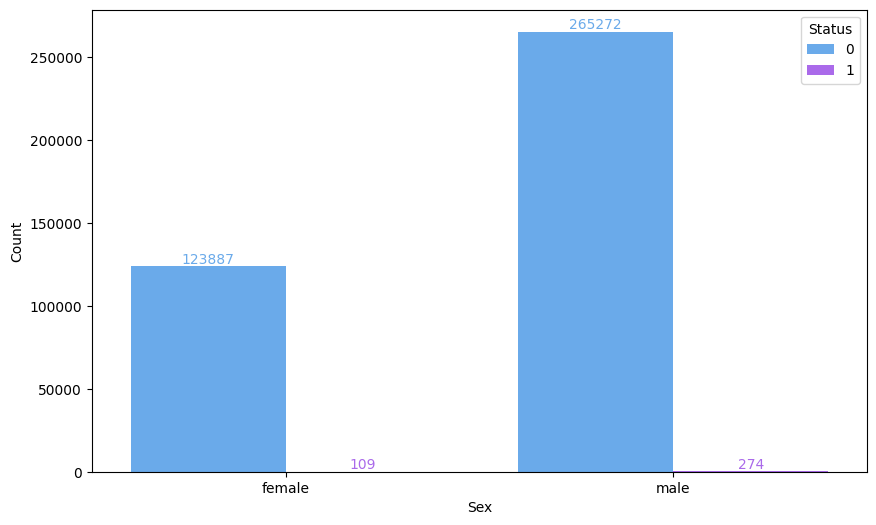

In [17]:
sex_target_count = train_df.groupby(["sex", "target"]).size()
sex_target_count = pd.DataFrame(sex_target_count).reset_index()
sex_target_count.columns = ["Sex", "Status", "Count"]

fig = plt.figure(figsize = (10, 6))
ax = sns.barplot(x="Sex", y="Count", hue="Status", data=sex_target_count, palette="cool")

# Añadir anotaciones
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                xytext=(0, 5), 
                textcoords='offset points', 
                color=p.get_facecolor())

# Mostrar el gráfico
plt.show()

> **The code calculates and visualizes the count of target statuses grouped by sex in the train_df DataFrame using a bar plot, with annotations displaying the exact count on each bar.**

# Box plot for lesion size

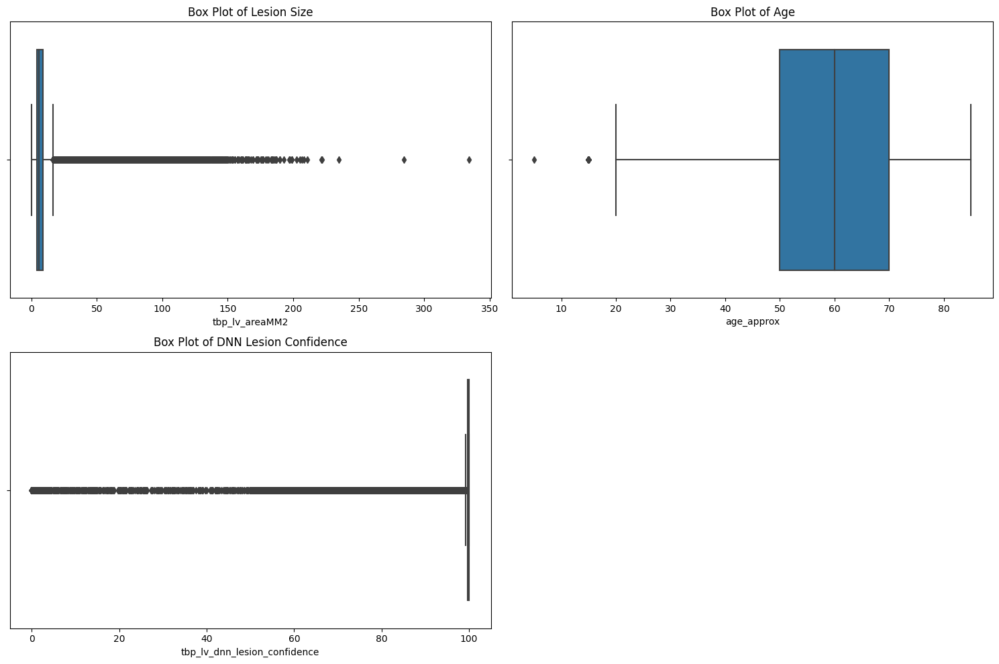

In [18]:
plt.figure(figsize=(15, 10))

# Box plot for lesion size
plt.subplot(2, 2, 1)
sns.boxplot(x=train_df['tbp_lv_areaMM2'])
plt.title('Box Plot of Lesion Size')

# Box plot for age
plt.subplot(2, 2, 2)
sns.boxplot(x=train_df['age_approx'])
plt.title('Box Plot of Age')

# Box plot for DNN lesion confidence
plt.subplot(2, 2, 3)
sns.boxplot(x=train_df['tbp_lv_dnn_lesion_confidence'])
plt.title('Box Plot of DNN Lesion Confidence')

plt.tight_layout()

plt.show()


> **The code generates a 2x2 grid of box plots to visualize the distribution and potential outliers for lesion size, age, and DNN lesion confidence in the train_df DataFrame.**

# **Graphical Representations**

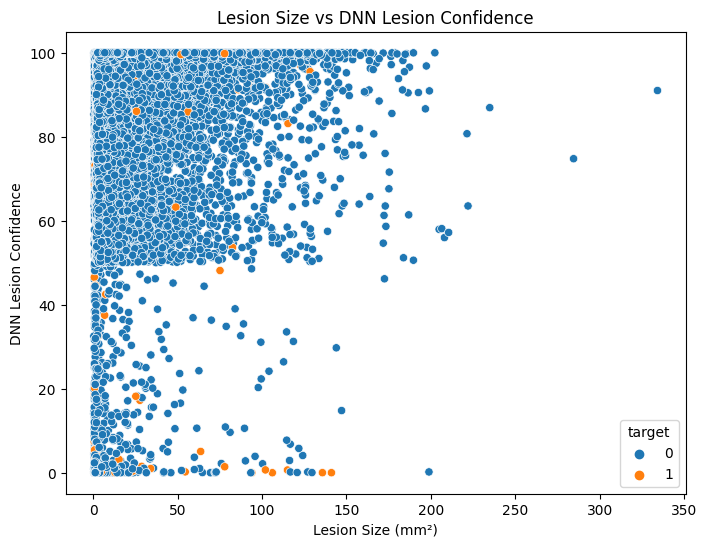

In [19]:
# Scatter plot between lesion size and DNN lesion confidence
plt.figure(figsize=(8, 6))
sns.scatterplot(x=train_df['tbp_lv_areaMM2'], y=train_df['tbp_lv_dnn_lesion_confidence'], hue=train_df['target'])
plt.title('Lesion Size vs DNN Lesion Confidence')
plt.xlabel('Lesion Size (mm²)')
plt.ylabel('DNN Lesion Confidence')
plt.show()


> **Scatter plot to visualize the relationship between lesion_size and DNN lesion confidence, with points colored according to the target variable, to explore potential correlations between these variables.**

# **Pair plot for a subset of features**

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to 

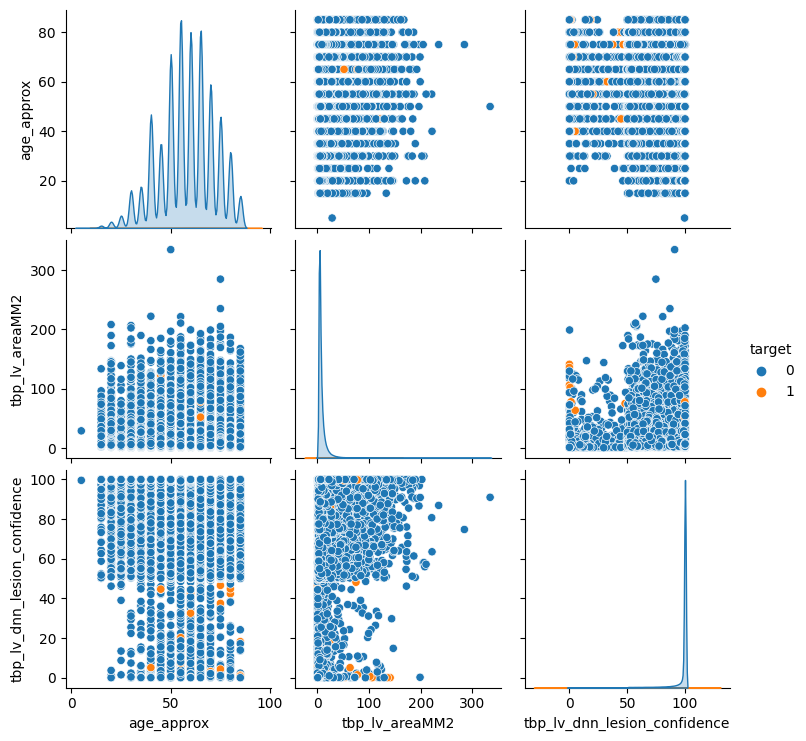

In [20]:
# Pair plot for a subset of features
sns.pairplot(train_df[['age_approx', 'tbp_lv_areaMM2', 'tbp_lv_dnn_lesion_confidence', 'target']], hue='target')

plt.show()

# **Perform Data Transformation**

In [21]:
import pandas as pd

from sklearn.preprocessing import StandardScaler, OneHotEncoder

train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')
# Example: Scaling numerical features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(train_df[['age_approx', 'tbp_lv_areaMM2', 'tbp_lv_perimeterMM']])

# Example: Encoding categorical features
encoder = OneHotEncoder()
encoded_features = encoder.fit_transform(train_df[['sex', 'anatom_site_general']]).toarray()

print("Scaled Features")
print(scaled_features)

print("")

print("encoded Features")
print(encoded_features)

/tmp/ipykernel_36/1963328773.py:5: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')


Scaled Features
[[ 0.14614534 -0.5565912  -0.43449214]
 [ 0.14614534 -0.78729636 -1.44016185]
 [ 0.14614534 -0.54495901 -0.50556386]
 ...
 [ 0.51389657 -0.59730388 -0.99319752]
 [-2.06036207 -0.25997031 -0.46722027]
 [-0.58935713 -0.16885142 -0.29563835]]

encoded Features
[[0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 1. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]


> **The code performs the following tasks:
> Scaling Numerical Features: Standardizes the numerical features age_approx, tbp_lv_areaMM2, and tbp_lv_perimeterMM using StandardScaler.
> Encoding Categorical Features: Converts categorical features sex and anatom_site_general into one-hot encoded arrays using OneHotEncoder.
> Printing Results: Displays the scaled numerical features and the one-hot encoded categorical features.**

# **Plotting Scaled Numerical Features**

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


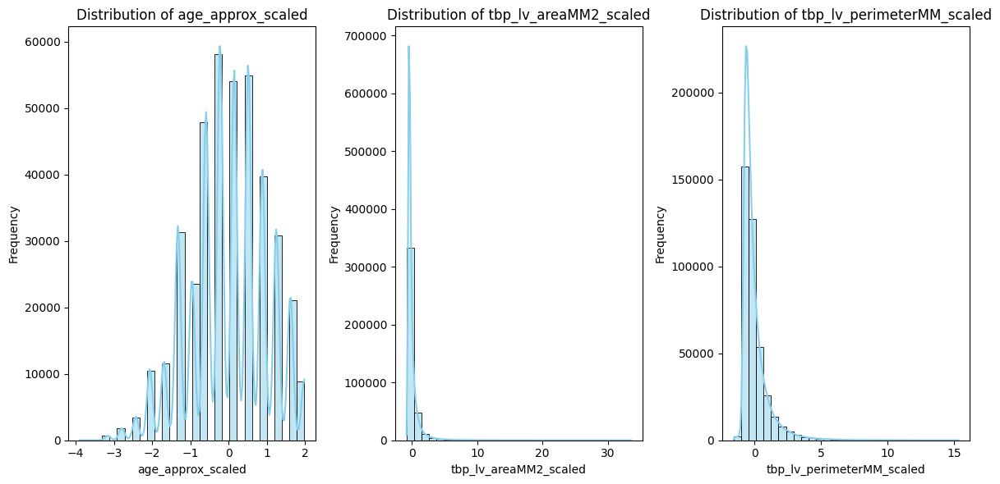

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Convert scaled features to DataFrame
scaled_df = pd.DataFrame(scaled_features, columns=['age_approx_scaled', 'tbp_lv_areaMM2_scaled', 'tbp_lv_perimeterMM_scaled'])

# Plot histograms for scaled numerical features
plt.figure(figsize=(12, 6))
for column in scaled_df.columns:
    plt.subplot(1, 3, list(scaled_df.columns).index(column) + 1)
    sns.histplot(scaled_df[column], kde=True, bins=30, color='skyblue')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

plt.tight_layout()

plt.show()



> **The code converts the scaled numerical features into a DataFrame and then plots histograms with KDE overlays for each scaled feature (age_approx_scaled, tbp_lv_areaMM2_scaled, tbp_lv_perimeterMM_scaled), displaying their distributions in a single figure with three subplots.**

# **Plotting Encoded Categorical Features**

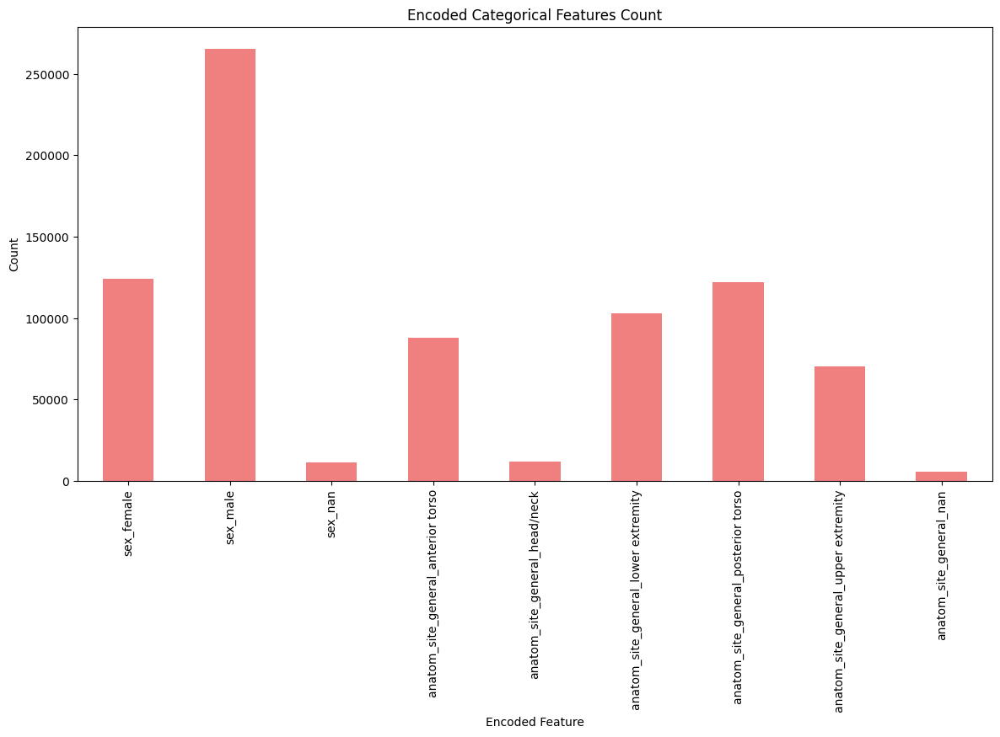

In [23]:
# Create a DataFrame from encoded features
encoded_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(['sex', 'anatom_site_general']))

# Summarize counts for each category
encoded_df_sum = encoded_df.sum()

# Plot bar plot for encoded features
plt.figure(figsize=(14, 7))
encoded_df_sum.plot(kind='bar', color='lightcoral')
plt.title('Encoded Categorical Features Count')
plt.xlabel('Encoded Feature')
plt.ylabel('Count')
plt.xticks(rotation=90)

plt.show()


> **The code creates a DataFrame from the one-hot encoded categorical features and calculates the sum of each encoded category. It then plots a bar chart showing the counts of these encoded features, with each bar representing the total count for a specific encoded category.**

# **Visualize Data Relationships**

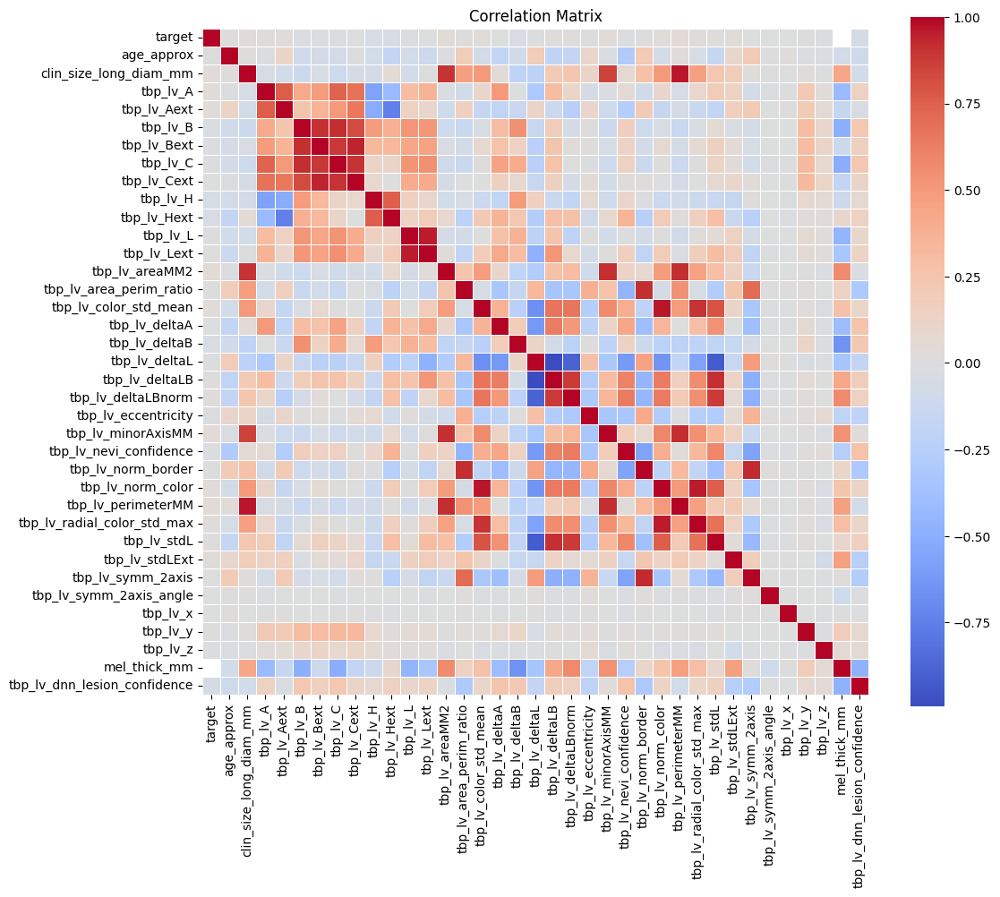

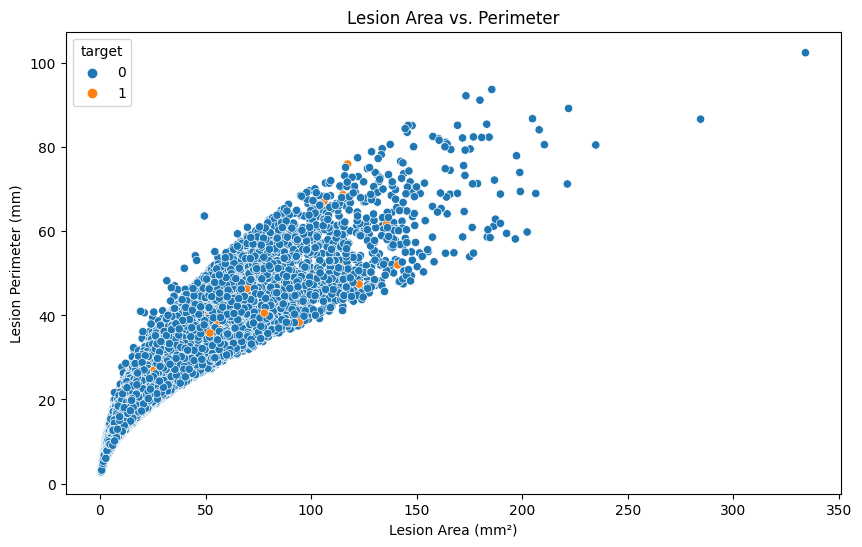

In [24]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv', low_memory=False)

# Filter only numeric columns for the correlation matrix
numeric_cols = train_df.select_dtypes(include=['number']).columns
corr_matrix = train_df[numeric_cols].corr()

# Correlation matrix plot without numbers
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap='coolwarm', fmt='.2f', cbar=True, square=True, linewidths=0.5)
plt.title('Correlation Matrix')

plot_path = '/kaggle/working/Correlation Matrix.png'
plt.savefig(plot_path)

plt.show()

# Scatter plot of lesion area vs. perimeter
# Ensure columns exist and are numeric
if 'tbp_lv_areaMM2' in train_df.columns and 'tbp_lv_perimeterMM' in train_df.columns and 'target' in train_df.columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=train_df, x='tbp_lv_areaMM2', y='tbp_lv_perimeterMM', hue='target')
    plt.title('Lesion Area vs. Perimeter')
    plt.xlabel('Lesion Area (mm²)')
    plt.ylabel('Lesion Perimeter (mm)')
    plt.show()
else:
    print("One or more columns used in the scatter plot are missing or non-numeric.")


> **Correlation matrix heatmap for numeric columns in the dataset and a scatter plot of lesion area versus perimeter, with points colored by the target variable, provided the necessary columns are present.**

# **Outlier Detection**

# 1. **IQR Method**

In [25]:
# Outlier detection using IQR for lesion size
Q1 = train_df['tbp_lv_areaMM2'].quantile(0.25)
Q3 = train_df['tbp_lv_areaMM2'].quantile(0.75)
IQR = Q3 - Q1

outliers = train_df[(train_df['tbp_lv_areaMM2'] < (Q1 - 1.5 * IQR)) | (train_df['tbp_lv_areaMM2'] > (Q3 + 1.5 * IQR))]
print(f'Number of outliers in lesion size: {outliers.shape[0]}')

Number of outliers in lesion size: 36748


> **The code detects outliers in the tbp_lv_areaMM2 (lesion size) column using the Interquartile Range (IQR) method and prints the number of outliers found, which is 36,748.**

# 2. **Z-Score Method**

In [26]:
from scipy import stats
import numpy as np

# Outlier detection using Z-scores
# Apply dropna() to the DataFrame subset to handle missing values
z_scores = np.abs(stats.zscore(train_df[['tbp_lv_areaMM2', 'age_approx', 'tbp_lv_dnn_lesion_confidence']].dropna()))

# Identify outliers (those with a Z-score greater than 3)
outliers_z = (z_scores > 3).sum(axis=0)

print('Number of outliers using Z-score method:', outliers_z)

Number of outliers using Z-score method: tbp_lv_areaMM2                   7542
age_approx                        645
tbp_lv_dnn_lesion_confidence    13384
dtype: int64


# **Box Plot for Outlier Detection**

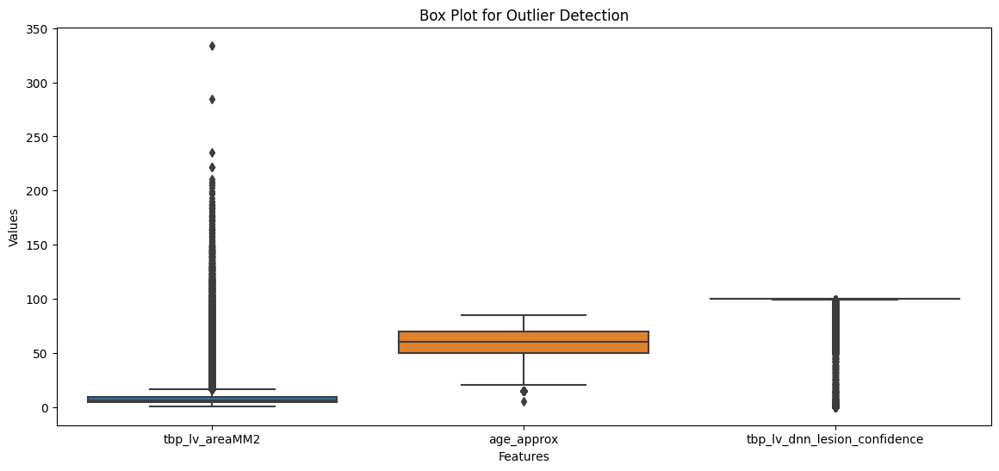

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select the columns of interest and drop any rows with missing values
columns_of_interest = ['tbp_lv_areaMM2', 'age_approx', 'tbp_lv_dnn_lesion_confidence']
df_cleaned = train_df[columns_of_interest].dropna()

# Create a box plot for each column to visualize outliers
plt.figure(figsize=(14, 6))
sns.boxplot(data=df_cleaned)

# Add title and labels
plt.title('Box Plot for Outlier Detection')
plt.xlabel('Features')
plt.ylabel('Values')

# Show the plot
plt.show()

> **The code creates a box plot for three selected features (tbp_lv_areaMM2, age_approx, and tbp_lv_dnn_lesion_confidence) from the train_df DataFrame after removing any rows with missing values. This visualization helps identify outliers for each feature by displaying the spread and potential outliers in the data.**

# **Correlation Analysis**

**Correlation Matrix and Heatmap**

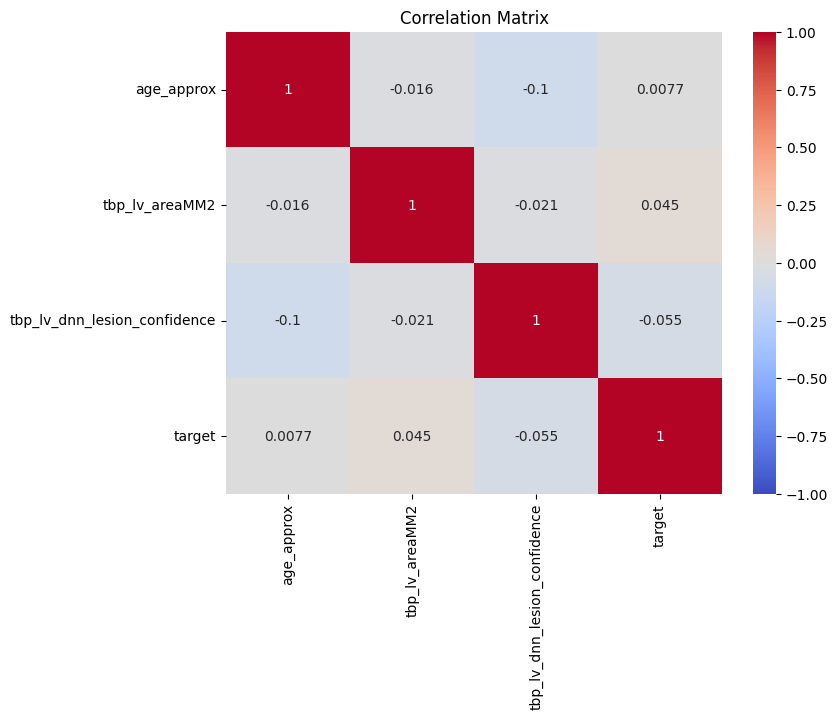

In [28]:
# Compute the correlation matrix
corr_matrix = train_df[['age_approx', 'tbp_lv_areaMM2', 'tbp_lv_dnn_lesion_confidence', 'target']].corr()

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()


> **The code calculates and visualizes the correlation matrix for selected features (age_approx, tbp_lv_areaMM2, tbp_lv_dnn_lesion_confidence, and target) from the train_df DataFrame, displaying the correlations in a heatmap with color gradients ranging from -1 to 1.**

# **Handling Missing Values**

# **Imputation**

In [29]:
# Impute missing values for numerical features with mean
for col in ['age_approx', 'tbp_lv_areaMM2', 'tbp_lv_dnn_lesion_confidence']:
    train_df[col].fillna(train_df[col].mean(), inplace=True)

# Check for remaining missing values
print(train_df.isnull().sum())

/tmp/ipykernel_36/3969670540.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train_df[col].fillna(train_df[col].mean(), inplace=True)


isic_id                              0
target                               0
patient_id                           0
age_approx                           0
sex                              11517
anatom_site_general               5756
clin_size_long_diam_mm               0
image_type                           0
tbp_tile_type                        0
tbp_lv_A                             0
tbp_lv_Aext                          0
tbp_lv_B                             0
tbp_lv_Bext                          0
tbp_lv_C                             0
tbp_lv_Cext                          0
tbp_lv_H                             0
tbp_lv_Hext                          0
tbp_lv_L                             0
tbp_lv_Lext                          0
tbp_lv_areaMM2                       0
tbp_lv_area_perim_ratio              0
tbp_lv_color_std_mean                0
tbp_lv_deltaA                        0
tbp_lv_deltaB                        0
tbp_lv_deltaL                        0
tbp_lv_deltaLB           

> **The code imputes missing values for the numerical features (age_approx, tbp_lv_areaMM2, and tbp_lv_dnn_lesion_confidence) in the train_df DataFrame with their respective mean values and then checks for any remaining missing values. The output shows that while missing values for these numerical features have been addressed, there are still missing values in other columns, including categorical ones like sex, anatom_site_general, and various other fields.**

# **Summary Statistics**

**Descriptive statistics**

In [30]:
# Descriptive statistics
print(train_df[['age_approx', 'tbp_lv_areaMM2', 'tbp_lv_dnn_lesion_confidence']].describe())

          age_approx  tbp_lv_areaMM2  tbp_lv_dnn_lesion_confidence
count  401059.000000   401059.000000                  4.010590e+05
mean       58.012986        8.539975                  9.716220e+01
std        13.548654        9.679312                  8.995782e+00
min         5.000000        0.431601                  1.261082e-16
25%        50.000000        4.109589                  9.966882e+01
50%        60.000000        5.685870                  9.999459e+01
75%        70.000000        9.119910                  9.999996e+01
max        85.000000      334.152700                  1.000000e+02


# **Testing Assumptions**

# **Shapiro-Wilk Test**

In [31]:
# Shapiro-Wilk test for normality
for column in ['age_approx', 'tbp_lv_areaMM2', 'tbp_lv_dnn_lesion_confidence']:
    stat, p = stats.shapiro(train_df[column].dropna())
    print(f'Shapiro-Wilk Test for {column}: Statistics={stat}, p-value={p}')


Shapiro-Wilk Test for age_approx: Statistics=0.9796548345885825, p-value=3.674806228005634e-95
Shapiro-Wilk Test for tbp_lv_areaMM2: Statistics=0.5158353030119565, p-value=1.4948355958698894e-193
Shapiro-Wilk Test for tbp_lv_dnn_lesion_confidence: Statistics=0.3580790713719926, p-value=5.260568521425163e-204


/opt/conda/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 401059.
  res = hypotest_fun_out(*samples, **kwds)


> **The code performs the Shapiro-Wilk test for normality on three numerical columns (age_approx, tbp_lv_areaMM2, and tbp_lv_dnn_lesion_confidence) from the train_df DataFrame. It prints the test statistics and p-values for each column to assess whether the data follows a normal distribution.**

# **Breusch-Pagan Test(Homoscedasticity Test)**

In [32]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan

# Load the data
train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')

# Check for missing values in the relevant columns
print("Missing values in columns:")
print(train_df[['age_approx', 'tbp_lv_areaMM2', 'tbp_lv_dnn_lesion_confidence']].isnull().sum())

# Drop rows with missing values or handle them (e.g., fill with mean or median)
train_df = train_df.dropna(subset=['age_approx', 'tbp_lv_areaMM2', 'tbp_lv_dnn_lesion_confidence'])

# Check for infinite values and replace them (e.g., with NaN and then drop them)
train_df.replace([np.inf, -np.inf], np.nan, inplace=True)
train_df = train_df.dropna(subset=['age_approx', 'tbp_lv_areaMM2', 'tbp_lv_dnn_lesion_confidence'])

# Prepare the features and response variable
X = train_df[['age_approx', 'tbp_lv_areaMM2']]
X = sm.add_constant(X)  # Add a constant term for the intercept
y = train_df['tbp_lv_dnn_lesion_confidence']

# Fit a linear model
model = sm.OLS(y, X).fit()

# Perform Breusch-Pagan test
bp_test = het_breuschpagan(model.resid, model.model.exog)
print('Breusch-Pagan Test:', bp_test)


/tmp/ipykernel_36/165105654.py:7: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')


Missing values in columns:
age_approx                      2798
tbp_lv_areaMM2                     0
tbp_lv_dnn_lesion_confidence       0
dtype: int64
Breusch-Pagan Test: (783.8170642076443, 6.255861086540707e-171, 392.67840992979416, 4.264435050680694e-171)


> **The code handles missing and infinite values in specific columns, fits an OLS linear regression model with the selected features and response variable, and performs the Breusch-Pagan test, which suggests the presence of heteroscedasticity in the model residuals.**

# **Advanced Visualizations**

# 1. **Violin Plots**

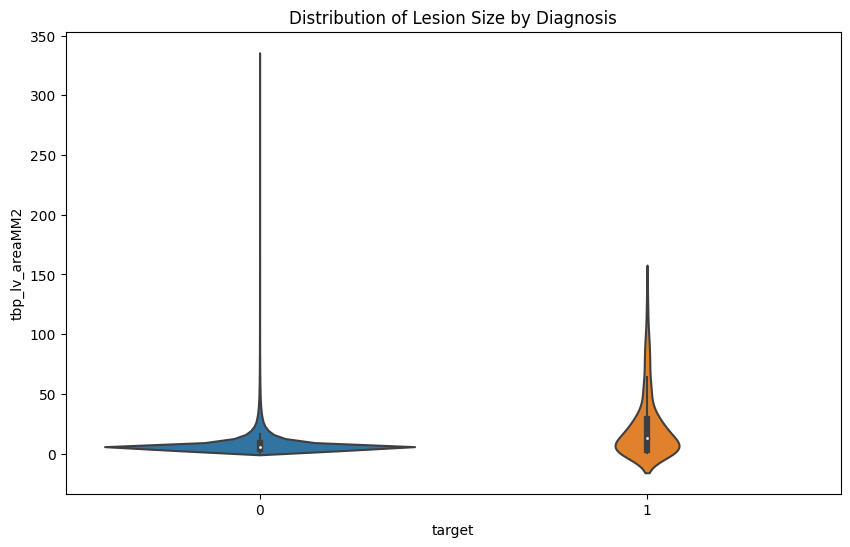

In [33]:
# Violin plot to display the distribution of lesion sizes by diagnosis
plt.figure(figsize=(10, 6))
sns.violinplot(x='target', y='tbp_lv_areaMM2', data=train_df)
plt.title('Distribution of Lesion Size by Diagnosis')

plt.show()

# 2. **Anatomy Distribution**

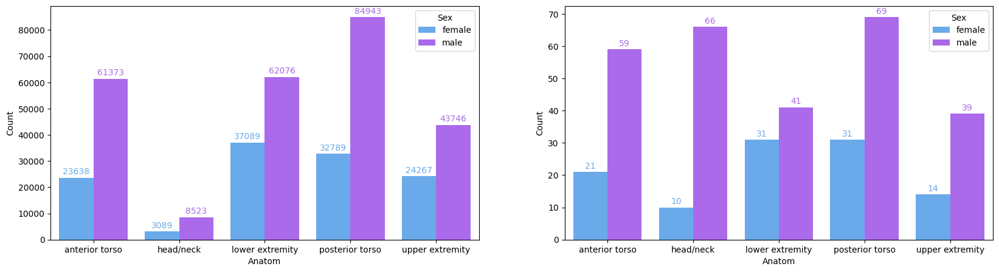

In [34]:
fig, axes = plt.subplots(1, 2, figsize=(20, 5))

anatom = pd.DataFrame(train_df.groupby(["anatom_site_general", "sex", "target"]).size()).reset_index()
anatom.columns = ["Anatom", "Sex", "Target", "Count"]

# Primer gráfico
ax1 = sns.barplot(x="Anatom", y="Count", hue="Sex", data=anatom[anatom["Target"] == 0], ax=axes[0], palette="cool")
# Añadir anotaciones al primer gráfico
for p in ax1.patches:
    ax1.annotate(f'{p.get_height():.0f}', 
                 (p.get_x() + p.get_width() / 2., p.get_height()), 
                 ha='center', va='center', 
                 xytext=(0, 7), 
                 textcoords='offset points', 
                 color=p.get_facecolor())

# Segundo gráfico
ax2 = sns.barplot(x="Anatom", y="Count", hue="Sex", data=anatom[anatom["Target"] == 1], ax=axes[1], palette="cool")
# Añadir anotaciones al segundo gráfico
for p in ax2.patches:
    ax2.annotate(f'{p.get_height():.0f}', 
                 (p.get_x() + p.get_width() / 2., p.get_height()), 
                 ha='center', va='center', 
                 xytext=(0, 7), 
                 textcoords='offset points', 
                 color=p.get_facecolor())

# Mostrar la figura
plt.show()


# 3. **Numeric Variables Distribution**

/tmp/ipykernel_36/2847654258.py:6: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')
/opt/conda/lib/python3.10/site-packages/scipy/stats/_stats_py.py:5655: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rpb, prob = pearsonr(x, y)


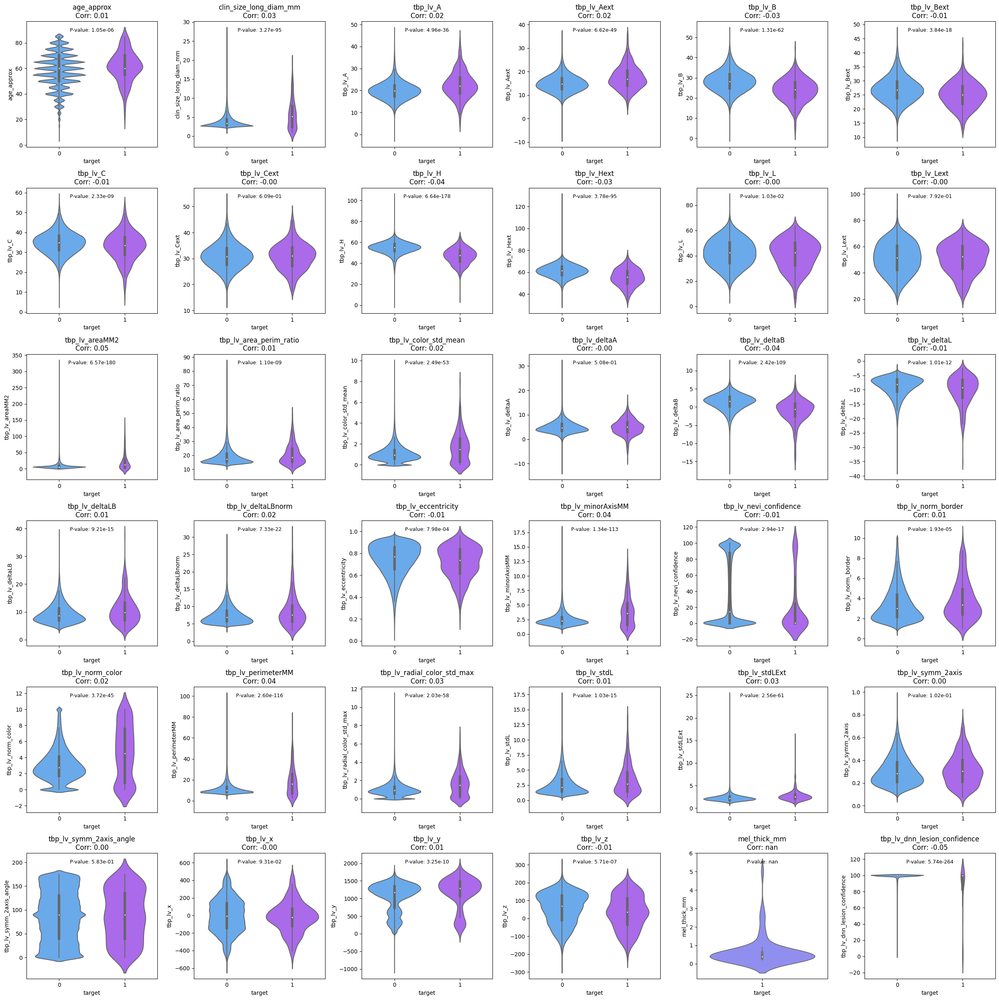

In [35]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pointbiserialr

train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')

# Supongamos que tienes un DataFrame llamado df
numeric_columns = train_df.select_dtypes(include=['number'])

# Crear una figura con un tamaño adecuado para 36 gráficos (6x6)
fig, axes = plt.subplots(6, 6, figsize=(25, 25))

# Iterar sobre las columnas numéricas, excepto 'target'
for idx, column in enumerate(numeric_columns.columns[1:]):
    # Crear un nuevo DataFrame eliminando los valores nulos para la columna actual y 'target'
    df_temp = train_df[['target', column]].dropna()
    
    # Calcular la correlación de punto biserial entre 'target' y la columna actual
    correlation, p_value = pointbiserialr(df_temp['target'], df_temp[column])
    
    ax = axes[idx // 6, idx % 6]
    
    # Crear un gráfico de violín para cada columna
    sns.violinplot(x='target', y=column, data=df_temp, ax=ax, palette="cool")
    
    # Establecer el título con la correlación
    ax.set_title(f'{column}\nCorr: {correlation:.2f}')
    
    # Opcional: Anotar el p-value si deseas mostrarlo también
    ax.annotate(f'P-value: {p_value:.2e}', xy=(0.5, 0.95), xycoords='axes fraction', ha='center', va='top', fontsize=9, color='black')

# Ajustar el layout para que los gráficos no se solapen
plt.tight_layout()

plt.show()

# 4.  **Distribution of melanoma thickness by age**

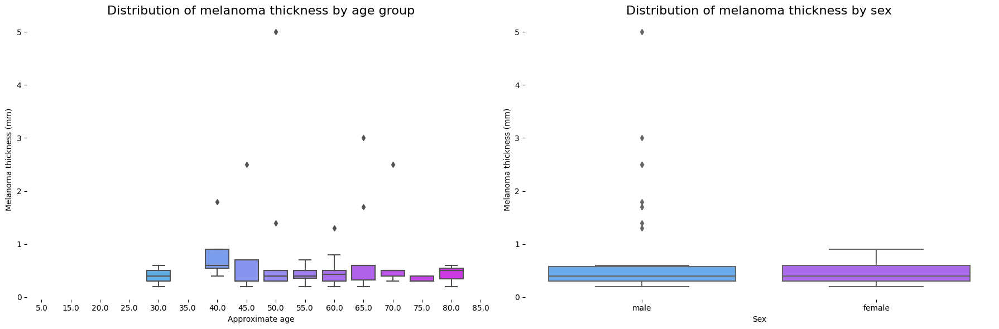

In [36]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

sns.boxplot(ax=axes[0], x='age_approx', y='mel_thick_mm', data=train_df, palette="cool")
axes[0].set_title('Distribution of melanoma thickness by age group', fontsize=16)
axes[0].set_xlabel('Approximate age')
axes[0].set_ylabel('Melanoma thickness (mm)')

# 2. Boxplot: Distribution of melanoma thickness by sex
sns.boxplot(ax=axes[1], x='sex', y='mel_thick_mm', data=train_df, palette="cool")
axes[1].set_title('Distribution of melanoma thickness by sex', fontsize=16)
axes[1].set_xlabel('Sex')
axes[1].set_ylabel('Melanoma thickness (mm)')

# Show the figure with both subplots
sns.despine(left=True, bottom=True)
plt.tight_layout()

plt.show()

# 5. **Inside lesion/outside lesion**

/tmp/ipykernel_36/1831432897.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train_df['tbp_lv_A'], kde=True, label='A inside lesion', ax=axes[0], color=sns.color_palette(palette)[0])
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_36/1831432897.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level functio

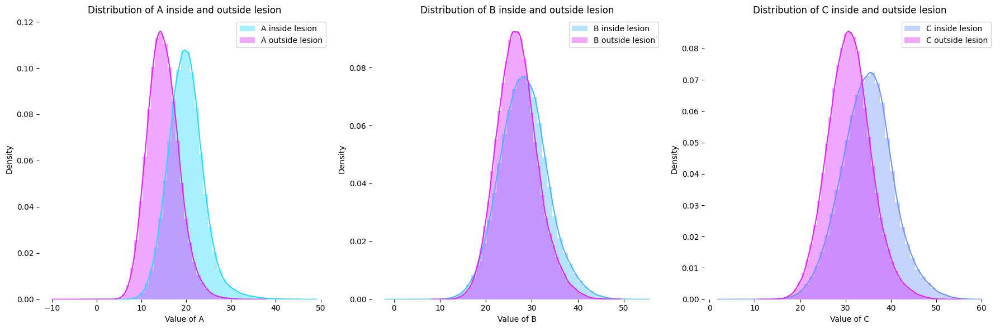

In [37]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

palette = "cool"

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

sns.distplot(train_df['tbp_lv_A'], kde=True, label='A inside lesion', ax=axes[0], color=sns.color_palette(palette)[0])
sns.distplot(train_df['tbp_lv_Aext'], kde=True, label='A outside lesion', ax=axes[0], color=sns.color_palette(palette)[5])
axes[0].set_title('Distribution of A inside and outside lesion')
axes[0].set_xlabel('Value of A')
axes[0].set_ylabel('Density')
axes[0].legend()

sns.distplot(train_df['tbp_lv_B'], kde=True, label='B inside lesion', ax=axes[1], color=sns.color_palette(palette)[1])
sns.distplot(train_df['tbp_lv_Bext'], kde=True, label='B outside lesion', ax=axes[1], color=sns.color_palette(palette)[5])
axes[1].set_title('Distribution of B inside and outside lesion')
axes[1].set_xlabel('Value of B')
axes[1].set_ylabel('Density')
axes[1].legend()

sns.distplot(train_df['tbp_lv_C'], kde=True, label='C inside lesion', ax=axes[2], color=sns.color_palette(palette)[2])
sns.distplot(train_df['tbp_lv_Cext'], kde=True, label='C outside lesion', ax=axes[2], color=sns.color_palette(palette)[5])
axes[2].set_title('Distribution of C inside and outside lesion')
axes[2].set_xlabel('Value of C')
axes[2].set_ylabel('Density')
axes[2].legend()

sns.despine(left=True, bottom=True)
plt.tight_layout()

plt.show()


# 6. **Multicollinearity Issues**

/tmp/ipykernel_36/2284507655.py:6: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')


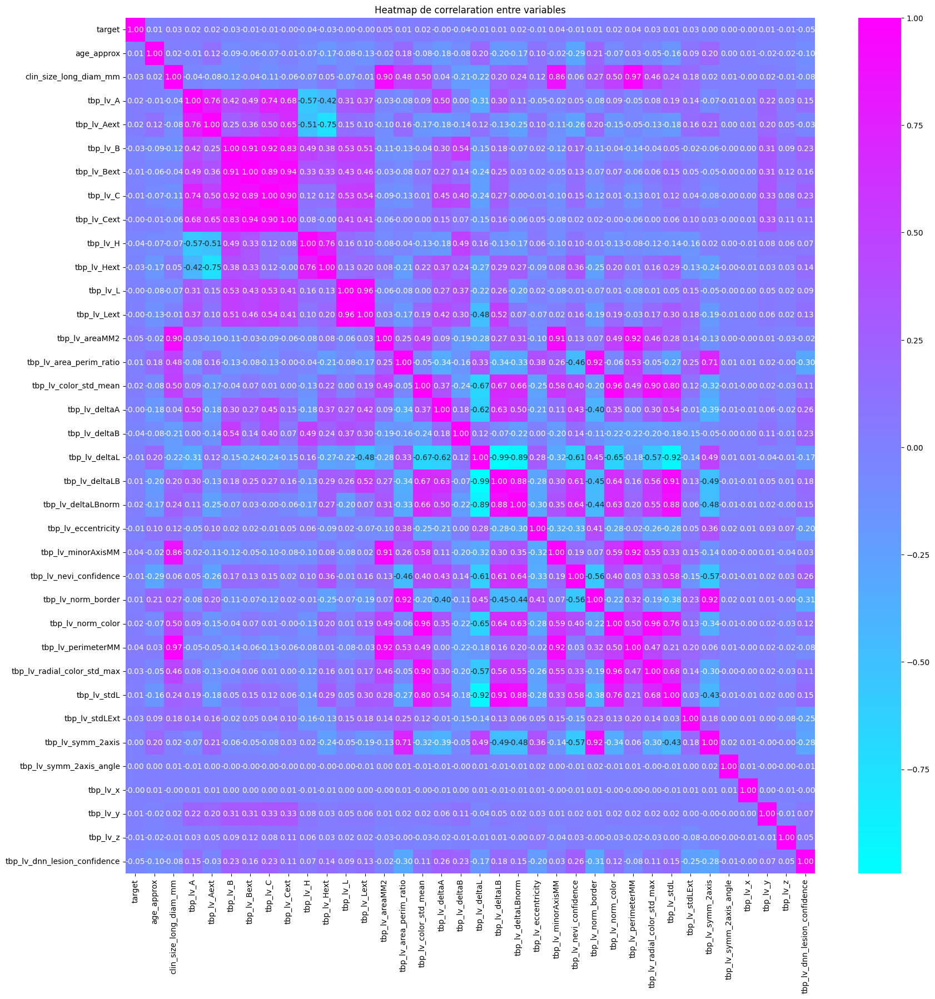

In [38]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')

# Select numeric columns and drop 'mel_thick_mm'
numeric_columns = train_df.select_dtypes(include=['number'])
numeric_columns = numeric_columns.drop("mel_thick_mm", axis=1, errors='ignore')  # Use errors='ignore' to avoid error if column doesn't exist

# Compute the correlation matrix
corr_matrix = numeric_columns.corr()

# Create the heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='cool', annot_kws={'size': 10})
plt.title('Heatmap de correlaration entre variables')

plt.show()

# 7. **Anscombe's Quartet**

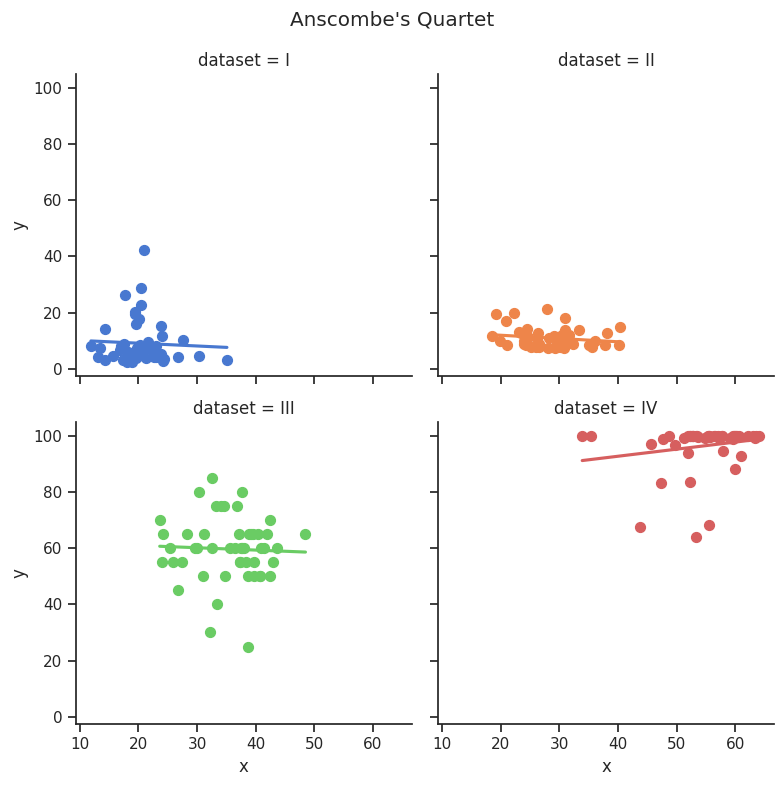

In [39]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Select columns with similar statistical properties
df1 = train_df[['tbp_lv_A', 'tbp_lv_areaMM2']].dropna().sample(50)
df2 = train_df[['tbp_lv_B', 'tbp_lv_perimeterMM']].dropna().sample(50)
df3 = train_df[['tbp_lv_C', 'age_approx']].dropna().sample(50)
df4 = train_df[['tbp_lv_H', 'tbp_lv_dnn_lesion_confidence']].dropna().sample(50)

# Rename the columns to match for Anscombe-like quartet
df1.columns = ['x', 'y']
df2.columns = ['x', 'y']
df3.columns = ['x', 'y']
df4.columns = ['x', 'y']

# Combine into one DataFrame with an additional column to distinguish each dataset
df1['dataset'] = 'I'
df2['dataset'] = 'II'
df3['dataset'] = 'III'
df4['dataset'] = 'IV'

# Concatenate all dataframes
anscombe_df = pd.concat([df1, df2, df3, df4], ignore_index=True)

# Set the visual aesthetics of the plots
sns.set(style="ticks")

# Create the plot
sns.lmplot(x='x', y='y', col='dataset', hue='dataset', data=anscombe_df,
           col_wrap=2, ci=None, palette="muted", height=4,
           scatter_kws={"s": 50, "alpha": 1})

# Add titles to each subplot
plt.subplots_adjust(top=0.9)
plt.suptitle("Anscombe's Quartet")
# Show the plot
plt.show()

# 8. **Grouped violinplots with split violins Use Sex**

/tmp/ipykernel_36/3734625873.py:6: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')


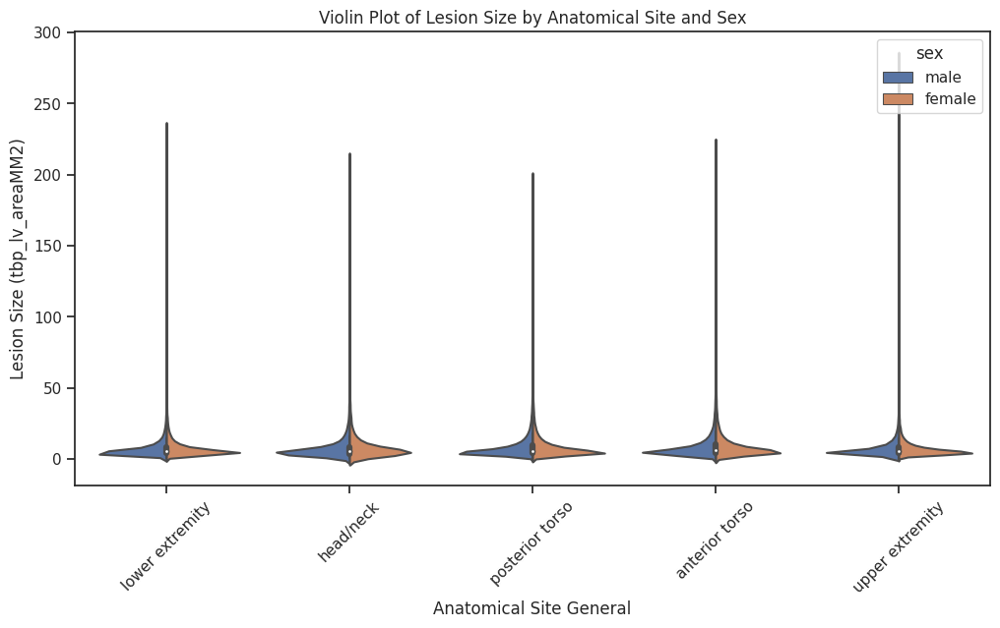

In [40]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')

# Set up the matplotlib figure
plt.figure(figsize=(12, 6))

# Create a violin plot with split violins
sns.violinplot(x='anatom_site_general', y='tbp_lv_areaMM2', hue='sex', split=True, data=train_df)

# Add titles and labels
plt.title('Violin Plot of Lesion Size by Anatomical Site and Sex')
plt.xlabel('Anatomical Site General')
plt.ylabel('Lesion Size (tbp_lv_areaMM2)')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.show()

# 9. **Hexbin plot with marginal distributions**

/tmp/ipykernel_36/4097496872.py:7: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


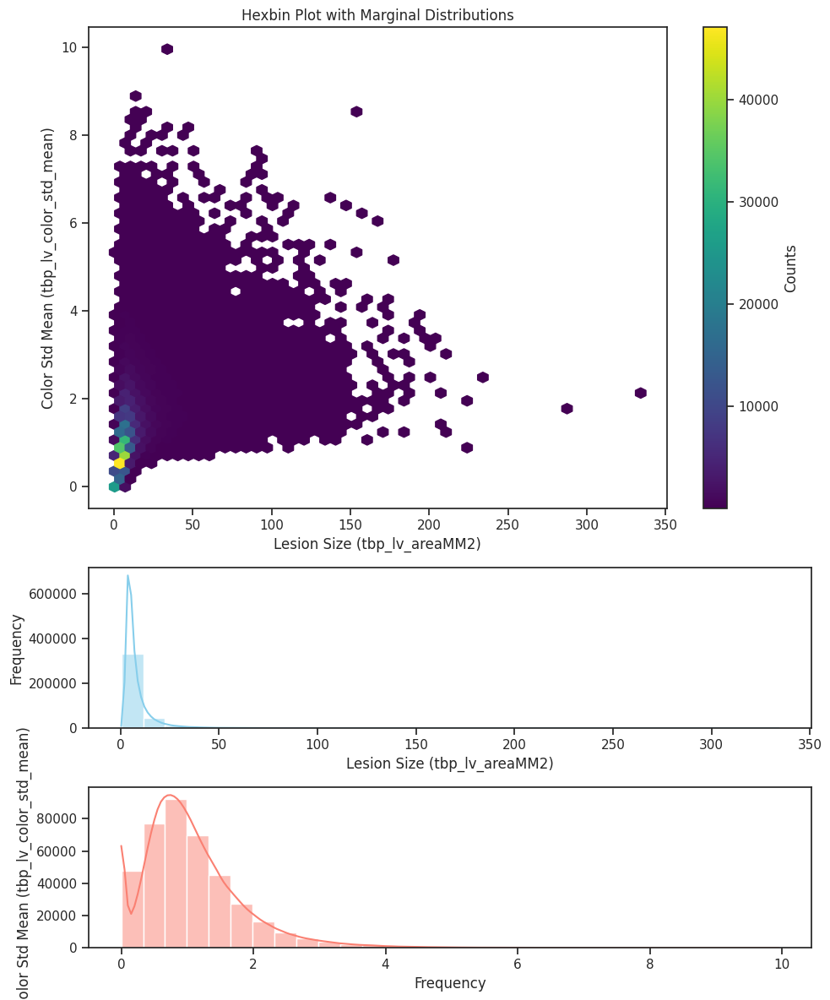

In [41]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Load the dataset
train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')

# Set up the matplotlib figure with additional subplots for marginals
fig, (ax_main, ax_x, ax_y) = plt.subplots(nrows=3, ncols=1, gridspec_kw={'height_ratios': [3, 1, 1]}, figsize=(10, 12))

# Hexbin plot (main plot)
hb = ax_main.hexbin(
    train_df['tbp_lv_areaMM2'],
    train_df['tbp_lv_color_std_mean'],
    gridsize=50,  # Size of the hexagons
    cmap='viridis',  # Color map for the hexbin plot
    mincnt=1        # Minimum count for hexagons to be drawn
)
ax_main.set_xlabel('Lesion Size (tbp_lv_areaMM2)')
ax_main.set_ylabel('Color Std Mean (tbp_lv_color_std_mean)')
ax_main.set_title('Hexbin Plot with Marginal Distributions')

# Add color bar for hexbin plot
cb = plt.colorbar(hb, ax=ax_main)
cb.set_label('Counts')

# Marginal histogram for x-axis
sns.histplot(
    train_df['tbp_lv_areaMM2'],
    bins=30,
    ax=ax_x,
    kde=True,
    color='skyblue'
)
ax_x.set_xlabel('Lesion Size (tbp_lv_areaMM2)')
ax_x.set_ylabel('Frequency')

# Marginal histogram for y-axis
sns.histplot(
    train_df['tbp_lv_color_std_mean'],
    bins=30,
    ax=ax_y,
    kde=True,
    color='salmon',
    orientation='horizontal'
)
ax_y.set_xlabel('Frequency')
ax_y.set_ylabel('Color Std Mean (tbp_lv_color_std_mean)')

# Adjust layout to avoid overlap
plt.tight_layout()

# Display the plot
plt.show()


# 10. **Plotting a three-way ANOVA**

/tmp/ipykernel_36/3565255666.py:9: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')
/opt/conda/lib/python3.10/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/opt/conda/lib/python3.10/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/opt/conda/lib/python3.10/site-packages/seaborn/categorical.py:641: FutureWarning: The default

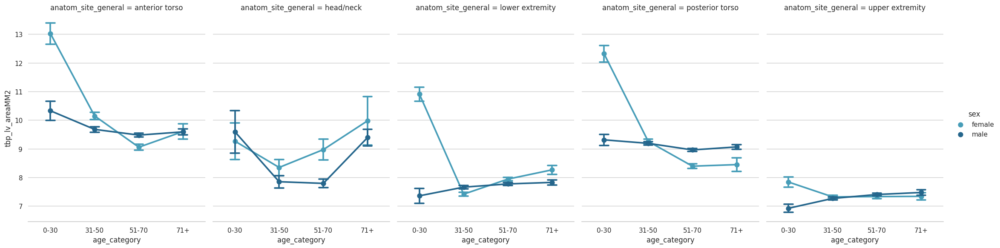

In [42]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set the theme for the plots
sns.set_theme(style="whitegrid")

# Load the dataset
train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')

# Prepare the data for plotting
# Convert 'sex' and 'anatom_site_general' to categorical types
train_df['sex'] = train_df['sex'].astype('category')
train_df['anatom_site_general'] = train_df['anatom_site_general'].astype('category')

# Choose 'age_approx' as a continuous variable and categorize it for better visualization
train_df['age_category'] = pd.cut(train_df['age_approx'], bins=[0, 30, 50, 70, 100], labels=['0-30', '31-50', '51-70', '71+'])

# Drop rows with missing values in relevant columns
df = train_df[['sex', 'anatom_site_general', 'age_category', 'tbp_lv_areaMM2']].dropna()

# Draw a point plot to show tbp_lv_areaMM2 as a function of three categorical factors
g = sns.catplot(
    data=df, x="age_category", y="tbp_lv_areaMM2", hue="sex", col="anatom_site_general",
    capsize=.2, palette="YlGnBu_d", errorbar="se",
    kind="point", height=6, aspect=.75
)

g.despine(left=True)

# plot_path = '/kaggle/working/Plotting a three-way ANOVA.png'
# plt.savefig(plot_path)

plt.show()


# 11. **Discovering structure in heatmap data**

/tmp/ipykernel_36/3461159549.py:6: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')


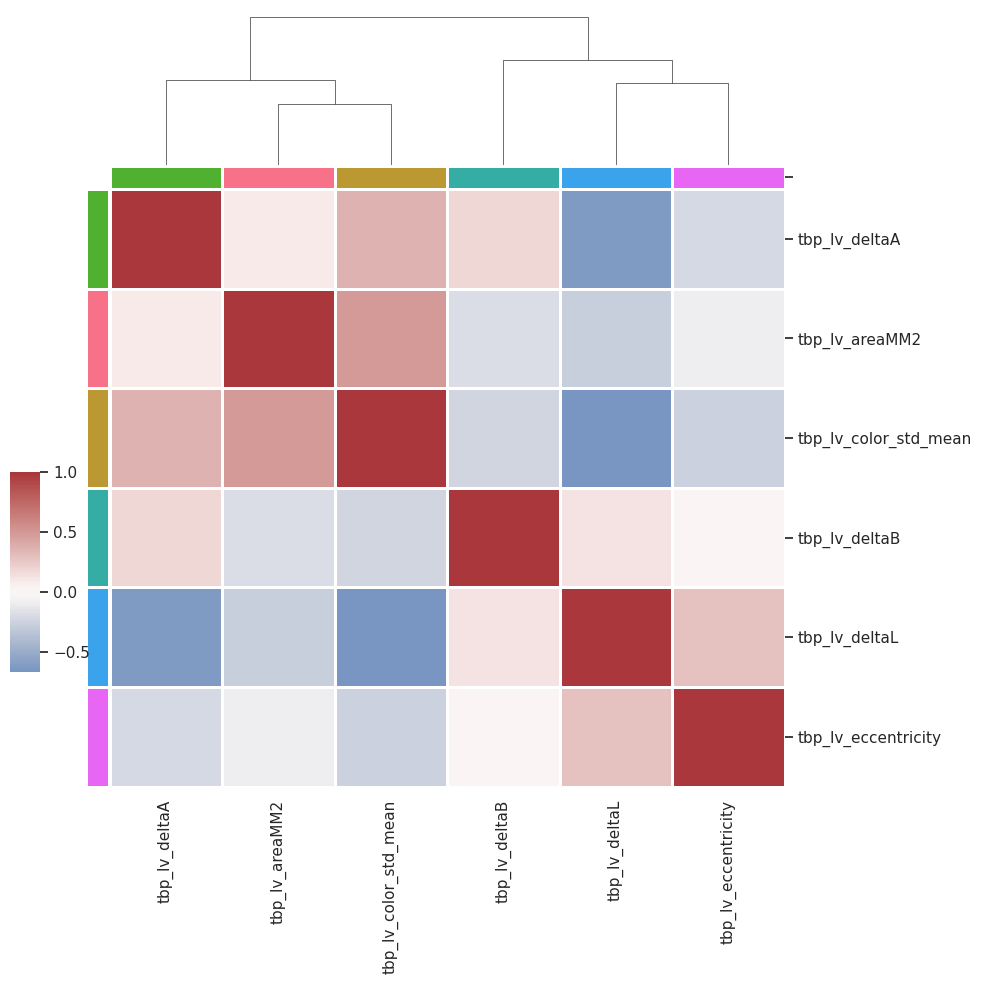

In [43]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')

# Select numeric columns for analysis
numeric_cols = [
    'tbp_lv_areaMM2', 'tbp_lv_color_std_mean', 'tbp_lv_deltaA', 
    'tbp_lv_deltaB', 'tbp_lv_deltaL', 'tbp_lv_eccentricity'
]
df_numeric = df[numeric_cols]

# Drop rows with any missing values
df_numeric = df_numeric.dropna()

# Calculate the correlation matrix
corr = df_numeric.corr()

# Create a categorical palette for the columns (example: for demonstration, using the same color)
network_pal = sns.color_palette("husl", len(numeric_cols))
network_lut = dict(zip(numeric_cols, network_pal))

# Convert the palette to vectors that will be drawn on the side of the matrix
column_colors = pd.Series(numeric_cols, index=df_numeric.columns).map(network_lut)

# Draw the clustermap
g = sns.clustermap(corr, center=0, cmap="vlag",
                   row_colors=column_colors, col_colors=column_colors,
                   dendrogram_ratio=(.1, .2),
                   cbar_pos=(.02, .32, .03, .2),
                   linewidths=.75, figsize=(10, 10))

# Remove the row dendrogram
g.ax_row_dendrogram.remove()

# plot_path = '/kaggle/working/Discovering structure in heatmap data.png'
# plt.savefig(plot_path)

# Show the plot
plt.show()


# 12. **Lineplot from a wide-form dataset**

/tmp/ipykernel_36/3674830670.py:6: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

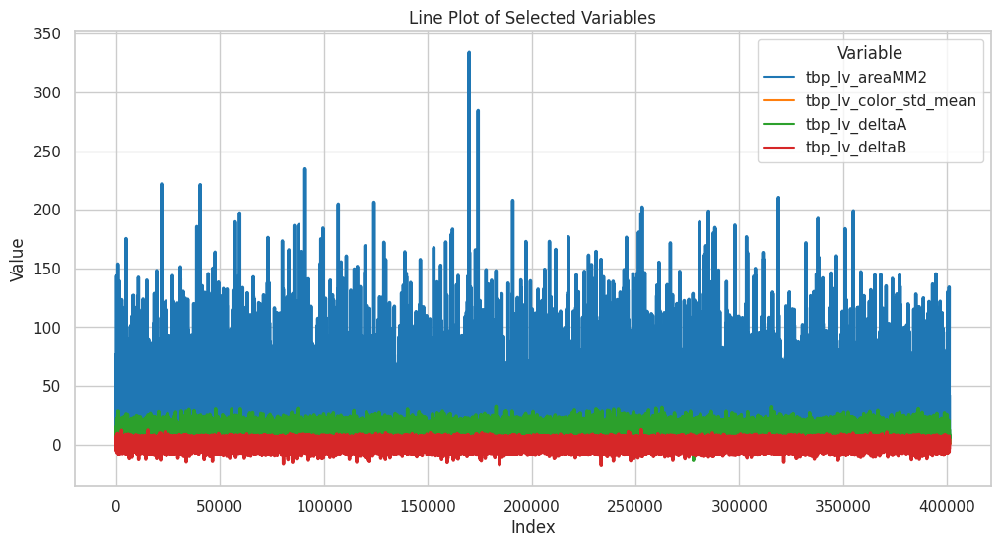

In [44]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')

# For demonstration, we'll use a few numeric columns. 
# Ensure to select columns based on your specific needs.
columns_to_plot = [
    'tbp_lv_areaMM2', 'tbp_lv_color_std_mean', 
    'tbp_lv_deltaA', 'tbp_lv_deltaB'
]

# Assuming these columns represent a time series or sequential data,
# you might need to add a time index. Here we'll use a simulated index for illustration.
df = df[columns_to_plot].copy()
df['index'] = range(len(df))  # Adding a sequential index for plotting

# Melt the dataframe to long-form
df_long = pd.melt(df, id_vars=['index'], var_name='variable', value_name='value')

# Set the plotting theme
sns.set_theme(style="whitegrid")

# Create the line plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_long, x='index', y='value', hue='variable', palette="tab10", linewidth=2.5)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Line Plot of Selected Variables')
plt.legend(title='Variable')

# plot_path = '/kaggle/working/Lineplot from a wide-form dataset.png'
# plt.savefig(plot_path)

# Show the plot
plt.show()


# 13. **3D Visualization of ISIC 2024 Data**

/tmp/ipykernel_36/2148181495.py:8: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')


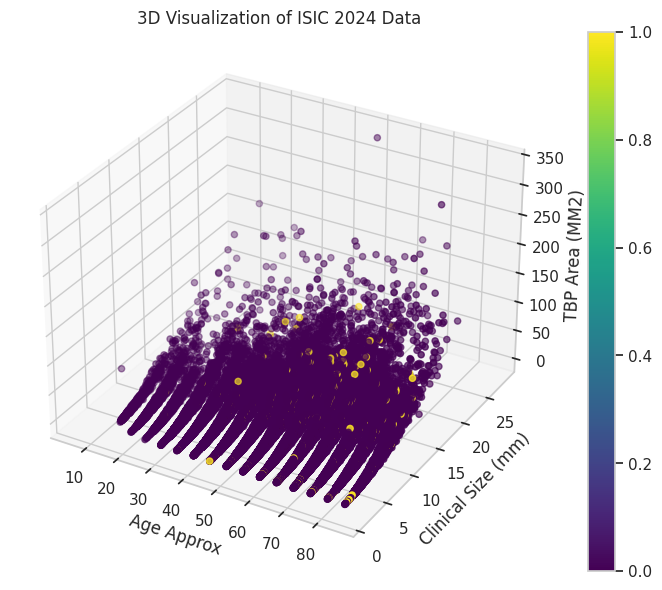

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import pandas as pd

# Load the data
train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')

# Set Seaborn style
sns.set(style="whitegrid")

# Create a 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Extract columns for plotting
x = train_df['age_approx']
y = train_df['clin_size_long_diam_mm']
z = train_df['tbp_lv_areaMM2']

# Scatter plot in 3D
sc = ax.scatter(x, y, z, c=train_df['target'], cmap='viridis', marker='o')

# Add color bar
plt.colorbar(sc)

# Set labels
ax.set_xlabel('Age Approx')
ax.set_ylabel('Clinical Size (mm)')
ax.set_zlabel('TBP Area (MM2)')

# Set the title
plt.title('3D Visualization of ISIC 2024 Data')

# plot_path = '/kaggle/working/3D Visualization of ISIC 2024 Data.png'
# plt.savefig(plot_path)

# Show the plot
plt.show()




# **Handling Outliers**

In [46]:
# Examine and remove outliers if necessary
print('Outliers in lesion size:', outliers[['tbp_lv_areaMM2']].head())

# Removing outliers from dataset
train_df_cleaned = train_df[~train_df['tbp_lv_areaMM2'].isin(outliers['tbp_lv_areaMM2'])]
print(f'Number of rows after removing outliers: {train_df_cleaned.shape[0]}')


Outliers in lesion size:     tbp_lv_areaMM2
22       76.693564
41       28.523180
49       31.975980
69       23.531619
76       28.617001
Number of rows after removing outliers: 364311


# **Before Removing Outliers Vs After Removing Outliers**

/tmp/ipykernel_36/492320949.py:6: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')


Outliers in lesion size:
    tbp_lv_areaMM2
22       76.693564
41       28.523180
49       31.975980
69       23.531619
76       28.617001
Number of rows after removing outliers: 361699


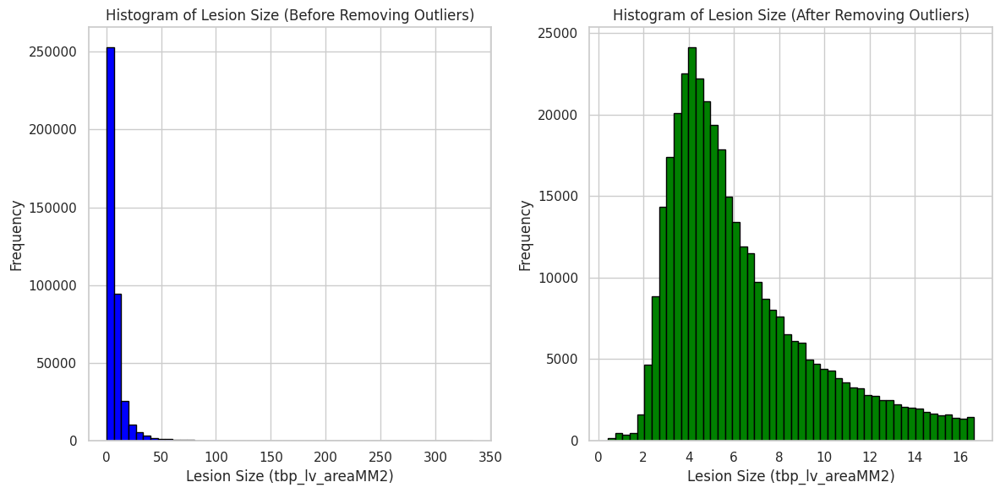

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data
train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')

# Drop rows with missing values
train_df = train_df.dropna(subset=['age_approx', 'tbp_lv_areaMM2', 'tbp_lv_dnn_lesion_confidence'])
train_df.replace([np.inf, -np.inf], np.nan, inplace=True)
train_df = train_df.dropna(subset=['age_approx', 'tbp_lv_areaMM2', 'tbp_lv_dnn_lesion_confidence'])

# Detect outliers using IQR method
Q1 = train_df['tbp_lv_areaMM2'].quantile(0.25)
Q3 = train_df['tbp_lv_areaMM2'].quantile(0.75)
IQR = Q3 - Q1

# Define outlier bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = train_df[(train_df['tbp_lv_areaMM2'] < lower_bound) | (train_df['tbp_lv_areaMM2'] > upper_bound)]
print('Outliers in lesion size:')
print(outliers[['tbp_lv_areaMM2']].head())

# Removing outliers from the dataset
train_df_cleaned = train_df[~train_df['tbp_lv_areaMM2'].isin(outliers['tbp_lv_areaMM2'])]
print(f'Number of rows after removing outliers: {train_df_cleaned.shape[0]}')

# Plot before and after removing outliers
plt.figure(figsize=(12, 6))

# Plot before
plt.subplot(1, 2, 1)
plt.hist(train_df['tbp_lv_areaMM2'], bins=50, color='blue', edgecolor='black')
plt.title('Histogram of Lesion Size (Before Removing Outliers)')
plt.xlabel('Lesion Size (tbp_lv_areaMM2)')
plt.ylabel('Frequency')

# Plot after
plt.subplot(1, 2, 2)
plt.hist(train_df_cleaned['tbp_lv_areaMM2'], bins=50, color='green', edgecolor='black')
plt.title('Histogram of Lesion Size (After Removing Outliers)')
plt.xlabel('Lesion Size (tbp_lv_areaMM2)')
plt.ylabel('Frequency')

# plot_path = '/kaggle/working/Histogram of Lesion Size (Before Removing Outliers).png'
# plt.savefig(plot_path)

# plot_path = '/kaggle/working/Histogram of Lesion Size (After Removing Outliers).png'
# plt.savefig(plot_path)

plt.tight_layout()
plt.show()


> **Detecting Outliers:
> 
>     The Interquartile Range (IQR) method is employed to detect outliers.
>     Calculation:
>         Q1 (1st quartile) and Q3 (3rd quartile) are determined.
>         IQR is calculated as the difference between Q3 and Q1.
>         Outliers are identified as values falling below Q1 - 1.5 * IQR or above Q3 + 1.5 * IQR.
> 
> Removing Outliers:
> 
>     Rows where the tbp_lv_areaMM2 feature is identified as an outlier are filtered out from the dataset.
> 
> Plotting:
> 
>     Two histograms are created:
>         One showing the distribution of tbp_lv_areaMM2 before outlier removal.
>         One showing the distribution of tbp_lv_areaMM2 after outlier removal.
>     This comparison visually demonstrates the impact of outlier removal on the distribution of the data.**

# **Dataset Balance or Inbalance**

# **Check Dataset Balance or Inbalance**

Target Distribution:
 target
0    400666
1       393
Name: count, dtype: int64


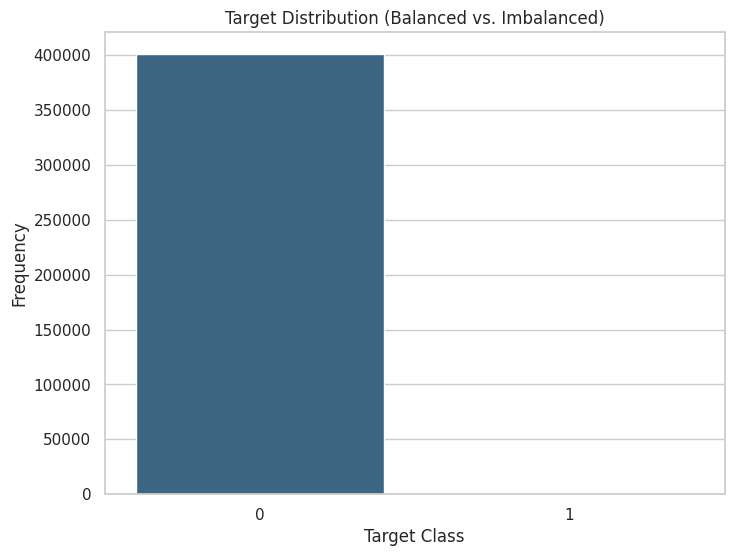

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv', low_memory=False)

# Check the distribution of the 'target' column
target_distribution = train_df['target'].value_counts()

# Print the distribution
print("Target Distribution:\n", target_distribution)

# Plot the distribution
plt.figure(figsize=(8, 6))
sns.barplot(x=target_distribution.index, y=target_distribution.values, palette='viridis')
plt.title('Target Distribution (Balanced vs. Imbalanced)')
plt.xlabel('Target Class')
plt.ylabel('Frequency')

plot_path = '/kaggle/working/Target Distribution (Balanced vs. Imbalanced).png'
plt.savefig(plot_path)

plt.show()


#  **The dataset is highly imbalanced. The class labeled 0 has 400,666 samples, while the class labeled 1 has only 393 samples. This severe imbalance can negatively impact the performance of machine learning models, as they might become biased towards the majority class.**

# **Balancing the Dataset**

**Undersampling the Majority Class**

Original Target Distribution:
 target
0    400666
1       393
Name: count, dtype: int64
Balanced Target Distribution:
 target
0    400666
1    400666
Name: count, dtype: int64


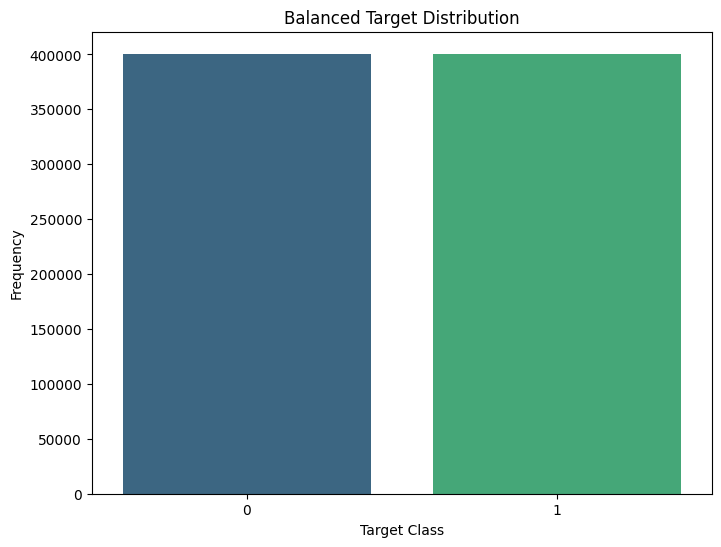

Balanced dataset saved to: /kaggle/working/balanced_dataset.csv


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.utils import resample

# Load the dataset
train_df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv', low_memory=False)

# Check the distribution of the 'target' column
target_distribution = train_df['target'].value_counts()

# Print the original distribution
print("Original Target Distribution:\n", target_distribution)

# Separate majority and minority classes
majority_class = train_df[train_df['target'] == target_distribution.idxmax()]
minority_class = train_df[train_df['target'] == target_distribution.idxmin()]

# Perform oversampling on the minority class
minority_class_oversampled = resample(minority_class,
                                      replace=True,   # Sample with replacement
                                      n_samples=len(majority_class),  # Match the majority class
                                      random_state=42)  # Set seed for reproducibility

# Combine majority class with oversampled minority class
train_df_balanced = pd.concat([majority_class, minority_class_oversampled])

# Check the new distribution
balanced_target_distribution = train_df_balanced['target'].value_counts()
print("Balanced Target Distribution:\n", balanced_target_distribution)

# Save the balanced dataset to a CSV file
balanced_dataset_path = '/kaggle/working/balanced_dataset.csv'
train_df_balanced.to_csv(balanced_dataset_path, index=False)

# Plot the balanced distribution
plt.figure(figsize=(8, 6))
sns.barplot(x=balanced_target_distribution.index, y=balanced_target_distribution.values, palette='viridis')
plt.title('Balanced Target Distribution')
plt.xlabel('Target Class')
plt.ylabel('Frequency')

plot_path = '/kaggle/working/Balanced_Target_Distribution.png'
plt.savefig(plot_path)

plt.show()

print(f"Balanced dataset saved to: {balanced_dataset_path}")


# <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:balck; font-size:200%; text-align:left;padding: 0px; border-bottom: 3px solid red">Image Processing & Model Tranning</p>

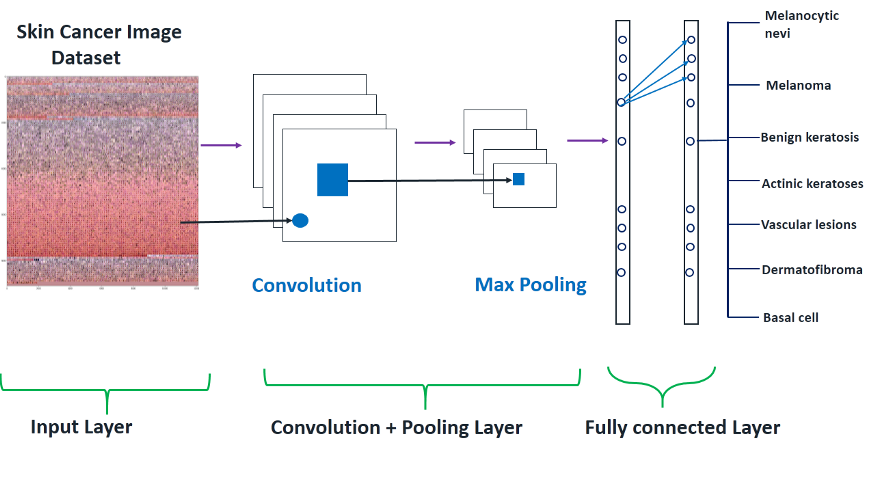

> **For your project, "ISIC 2024 - Skin Cancer Detection with 3D-TBP," you can follow these steps to preprocess images, including data cleaning,segmentation, and feature extraction. I'll provide a code structure that addresses hair removal, noise removal, contrast enhancement, resizing, and potential segmentation strategies, followed by feature extraction techniques.**

In [2]:
import pandas as pd
import numpy as np
import random
from scipy.stats import pointbiserialr
from  sklearn.preprocessing import OrdinalEncoder
import h5py
import os

# Data Viz

import seaborn as sns
import matplotlib.pyplot as plt

# Image Processing

import cv2
from PIL import Image
from io import BytesIO
import os

# Deep Learning Modules

from torch.utils.data import Dataset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import torch.optim as optim
import torch
import torch.nn as nn
import torch.nn.functional as F

import warnings
warnings.filterwarnings("ignore")

In [3]:
import pandas as pd

df = pd.read_csv('/kaggle/input/isic-2024-challenge/train-metadata.csv')
path_list = [f"/kaggle/input/isic-2024-challenge/train-image/image/{id}.jpg" for id in df.isic_id]

# **Image Processing**

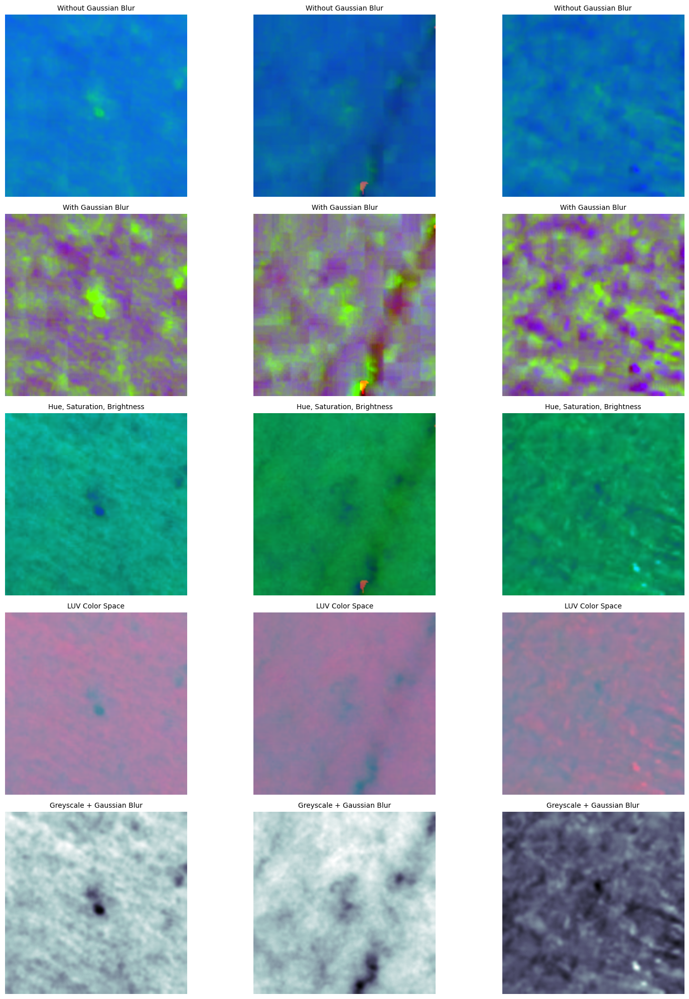

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

def apply_transformations(image_paths):
    selected_images = np.random.choice(image_paths, 3, replace=False)

    fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(16, 20))
    methods = ["Without Gaussian Blur", "With Gaussian Blur", "Hue, Saturation, Brightness", "LUV Color Space", "Greyscale + Gaussian Blur"]
    
    for index, method in enumerate(methods):
        for i, path in enumerate(selected_images):
            image = cv2.imread(path)

            if method == "Without Gaussian Blur":
                transformed_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
                transformed_image = cv2.resize(transformed_image, (200, 200))

            elif method == "With Gaussian Blur":
                transformed_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
                transformed_image = cv2.resize(transformed_image, (200, 200))
                transformed_image = cv2.addWeighted(transformed_image, 4, cv2.GaussianBlur(transformed_image, (0, 0), 256/10), -4, 128)

            elif method == "Hue, Saturation, Brightness":
                transformed_image = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
                transformed_image = cv2.resize(transformed_image, (200, 200))

            elif method == "LUV Color Space":
                transformed_image = cv2.cvtColor(image, cv2.COLOR_BGR2LUV)
                transformed_image = cv2.resize(transformed_image, (200, 200))

            elif method == "Greyscale + Gaussian Blur":
                transformed_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
                transformed_image = cv2.resize(transformed_image, (200, 200))
                transformed_image = cv2.GaussianBlur(transformed_image, (5, 5), 0)

            axes[index, i].imshow(transformed_image, cmap=plt.cm.bone if len(transformed_image.shape) == 2 else None)
            axes[index, i].axis('off')
            axes[index, i].set_title(method, fontsize=10)

    plt.tight_layout()
    plt.show()

apply_transformations(path_list)



# **Hair Remove**

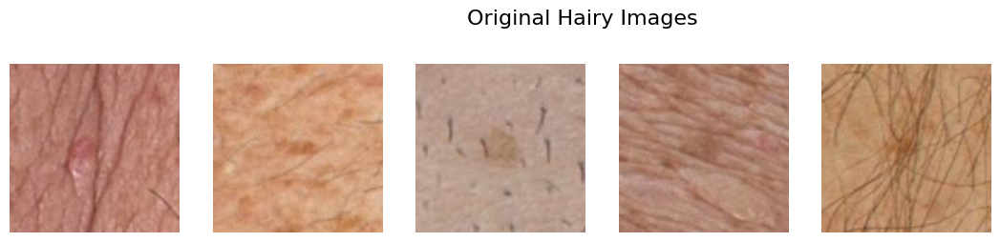

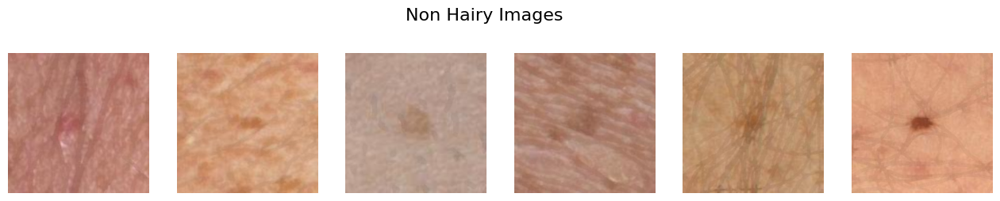

In [5]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg

image_hair = np.array(path_list)[[1, 2, 8, 11, 13, 17]]

def hair_remove(image):
    # convert image to grayScale
    grayScale = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # kernel for morphologyEx
    kernel = cv2.getStructuringElement(1,(17,17))

    # apply MORPH_BLACKHAT to grayScale image
    blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)

    # apply thresholding to blackhat
    _,threshold = cv2.threshold(blackhat,10,255,cv2.THRESH_BINARY)

    # inpaint with original image and threshold image
    final_image = cv2.inpaint(image,threshold,1,cv2.INPAINT_TELEA)

    return final_image

# Show the Augmented Images
plt.figure(figsize=(16,3))
plt.suptitle("Original Hairy Images", fontsize = 16)
    
for k, path in enumerate(image_hair[:5]):
    image = mpimg.imread(path)
    image = cv2.resize(image,(300, 300))
        
    plt.subplot(1, 6, k+1)
    plt.imshow(image)
    plt.axis('off')
    
    
# Show the sample
plt.figure(figsize=(16,3))
plt.suptitle("Non Hairy Images", fontsize = 16)
    
for k, path in enumerate(image_hair):
    image = mpimg.imread(path)
    image = cv2.resize(image,(300, 300))
    image = hair_remove(image)
        
    plt.subplot(1, 6, k+1)
    plt.imshow(image)
    plt.axis('off')

<p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:balck; font-size:200%; text-align:left;padding: 0px; border-bottom: 3px solid red">Model training(CNN USE WITH PYTORCH)</p>

# **Preparing the Data**

In [6]:
def seed_everything(seed=42):
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    torch.backends.cudnn.deterministic = True
seed_everything()

In [7]:
df["path_list"] = pd.Series(path_list)
melanoma = df[df["target"] == 1]
nonmelanoma = df[df["target"] == 0].sample(len(melanoma) * 3)

<Axes: xlabel='target', ylabel='count'>

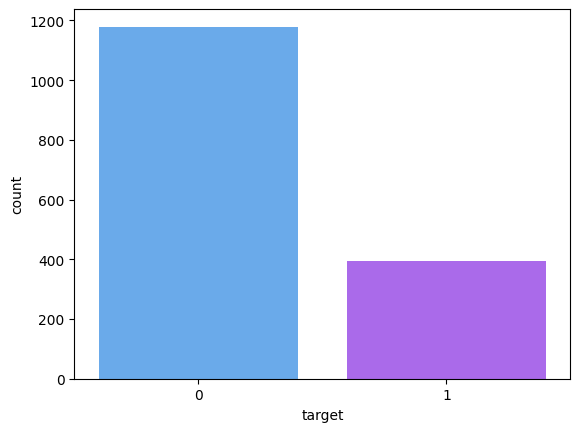

In [8]:
Data = pd.concat([melanoma, nonmelanoma], axis = 0).reset_index(drop = True)
df = Data[["path_list", "target"]]
sns.countplot(x = Data["target"], palette = "cool")

# **Model Creation and Training**

In [10]:
# Incluir la transformación personalizada en el pipeline
transform = transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

transform_test = transforms.Compose([
    transforms.Resize(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

class FlowerDataset(Dataset):
    
    def __init__(self, df, transform = None, Test_mode = False):
        
        self.df = df.reset_index(drop = True)
        self.path = self.df.iloc[:, 0]
        
        self.test_mode = Test_mode
        if self.test_mode == False:
            self.target = self.df.iloc[:, 1]
        self.transform = transform
        
    def __getitem__(self, index):

        img = Image.open(self.path[index])

        
        if transform is not None:
            
            img = transform(img)
            
        target = self.target[index]
        
        
        if self.test_mode == False:
            
            return img, target
        else:
            return img
       
    
    def __len__(self):
        
        return len(self.path)

> **Test and Train Data tansform and Hadle Images in dataset**

In [11]:
from sklearn.model_selection import train_test_split as tts
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df.iloc[:, 1] = label_encoder.fit_transform(df.iloc[:, 1])

# Mostrar los nombres de las clases y sus correspondientes etiquetas numéricas
for i, class_name in enumerate(label_encoder.classes_):
    print(f"Clase: {class_name}, Etiqueta: {i}")


Train, Test = tts(df, test_size = 0.01/2, stratify = df.iloc[:, 1])
Train, Valid = tts(Train, test_size = 0.1, stratify = Train.iloc[:, 1])

print(f"Train Shape is: {Train.shape}")
print(f"Valid Shape is: {Valid.shape}")
print(f"Test Shape is: {Test.shape}")

print(f"Validation and Test Len is {(Valid.shape[0]  + Test.shape[0]) / df.shape[0] :.2%}")

train_ds = FlowerDataset(Train, transform)
valid_ds = FlowerDataset(Valid, transform_test)
test_ds = FlowerDataset(Test, transform_test)

train_dl = DataLoader(train_ds, batch_size = 32, shuffle = True)
valid_dl = DataLoader(valid_ds, batch_size = 32, shuffle = False)
test_dl = DataLoader(test_ds, batch_size = 32, shuffle = False)

Clase: 0, Etiqueta: 0
Clase: 1, Etiqueta: 1
Train Shape is: (1407, 2)
Valid Shape is: (157, 2)
Test Shape is: (8, 2)
Validation and Test Len is 10.50%


> **This code prepares a dataset for training, validation, and testing using scikit-learn and PyTorch. It first encodes class labels with LabelEncoder and splits the dataset into training, validation, and test sets, ensuring stratification by class. The training set contains the majority of data, while validation and test sets are smaller. The data is then wrapped in custom FlowerDataset objects and loaded into PyTorch DataLoader instances for batch processing. The code also prints out the class labels, shapes of the datasets, and the combined percentage of data used for validation and testing.**

# **Train,Validation,plotting Function**

In [12]:
# Training function
def train(model, optimizer, criterion, train_dl, valid_dl, epochs):
    result = []
    val_res = []

    for e in range(epochs):
        print(f"Training the Epoch: {e + 1}")
        model.train()
        total_loss = 0
        total = 0
        correct = 0
        
        for X_train, y_train in train_dl:
            X_train, y_train = X_train.to(device).float(), y_train.to(device).long()
            
            y_pred = model(X_train)
            if isinstance(y_pred, tuple):  # In case of Inception
                y_pred = y_pred[0]
                
            loss = criterion(y_pred, y_train)
            
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            
            total_loss += loss.item()
            _, predicted = torch.max(y_pred.data, 1)
            total += y_train.size(0)
            correct += (predicted == y_train).sum().item()
            
        acc_train = 100 * correct / total
        _, val_acc = valid(model, valid_dl, device)
        
        print(f'Epoch: [{e+1}/{epochs}], Loss: {total_loss / total:.4f}, Train Acc: {acc_train:.2f}, Val Acc: {val_acc:.2f}')
        result.append(acc_train)
        val_res.append(val_acc)
    
    # Save results to files
    np.savetxt('result.csv', np.array(result), fmt='%.2f', delimiter=',')
    np.savetxt('val_result.csv', np.array(val_res), fmt='%.2f', delimiter=',')  
    
    
    
# Validation Function
def valid(model, val_loader, device):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for sample, target in val_loader:
            sample = sample.to(device).float()
            target = target.to(device).long()
            outputs = model(sample)
            _, predicted = torch.max(outputs.data, 1)
            
            total += target.size(0)
            correct += (predicted == target).sum().item()

    val_accuracy = 100 * correct / total
    return [], val_accuracy

def plot():
    train_data = np.loadtxt('result.csv', delimiter=',')
    val_data = np.loadtxt('val_result.csv', delimiter=',')
    plt.figure()
    plt.plot(range(1, len(train_data) + 1), train_data, color='blue', label='Train')
    plt.plot(range(1, len(val_data) + 1), val_data, color='red', label='Validation')
    plt.legend()
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('Accuracy (%)', fontsize=14)
    plt.title('Train and Validation Accuracy', fontsize=16)
    plt.savefig('plot.png')
    plt.show()

In [13]:
from torchvision import models

In [14]:
Inception = models.inception_v3(pretrained = False)
Resnet50 = models.resnet50(pretrained = True)
Alexnet = models.alexnet(pretrained=True)
VGG = models.vgg19(pretrained = True)
VGG_bn = models.vgg19_bn(pretrained = True)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 151MB/s] 
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 166MB/s]  
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 168MB/s]  
Downloading: "https://download.pytorch.org/models/vgg19_bn-c79401a0.pth" to /root/.cache/torch/hub/checkpoints/vgg19_bn-c79401a0.pth
100%|██████████| 548M/548M [00:03<00:00, 169MB/s]  


# **Prediction Functions**

In [28]:
# Valores de normalización comúnmente utilizados para imágenes RGB en PyTorch
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# Función para desnormalizar una imagen
def denormalize(image, mean, std):
    image = image.clone()  # Crear una copia para no modificar el original
    for t, m, s in zip(image, mean, std):
        t.mul_(s).add_(m)  # Desnormalizar
    return image

def preds(Model):
    # Ejemplo: obtener un batch de datos
    images, targets = next(iter(test_dl))  
    indices = np.arange(len(images))
    np.random.shuffle(indices)

    fig, axes = plt.subplots(8, 2, figsize=(15, 24))  # 16 filas y 2 columnas (imagen y gráfico de barras)
    axes = axes.ravel()

    # Establecer el color de fondo negro para todos los subplots
    for ax in axes:
        ax.set_facecolor('black')

    # Establecer el color de fondo negro para todo el gráfico
    fig.patch.set_facecolor('black')

    # Invertir el diccionario de LabelEncoder para mapear enteros a etiquetas
    int_to_label = {i: label for i, label in enumerate(label_encoder.classes_)}

    # Cálculo de precisión
    correct_predictions = {label: 0 for label in int_to_label.values()}
    total_predictions = {label: 0 for label in int_to_label.values()}


    # Limitar el número de iteraciones a la cantidad de subplots disponibles
    for i in range(min(len(indices), len(axes) // 2)):
        idx = indices[i]
        image, actual_target = images[idx], targets[idx]
        image_tensor = image.to(device).unsqueeze(0)
        output = Model(image_tensor)
        _, prediction = torch.max(output, 1)

        predicted_label = int_to_label[prediction.cpu().item()]  # Convertir a nombre de clase
        actual_label = int_to_label[actual_target.item()]
        total_predictions[actual_label] += 1
        if predicted_label == actual_label:
            correct_predictions[predicted_label] += 1

        # Convertir el tensor de imagen para graficar
        image = denormalize(image, mean, std)
        image = image.permute(1, 2, 0)  # Cambiar dimensiones de CxHxW a HxWxC
        image = image.cpu().numpy()

        # Mostrar imagen
        axes[2 * i].imshow(image)
        axes[2 * i].set_title(f"Actual Label: {actual_label}", color='white')
        axes[2 * i].axis('off')

        # Mostrar gráfico de barras con probabilidades
        probabilities = torch.nn.functional.softmax(output, dim=1).cpu().detach().numpy().flatten()
        bar_colors = ['white'] * len(probabilities)  # Colores por defecto

        # Cambiar colores de las barras según condiciones
        if predicted_label == actual_label:
            bar_colors[np.argmax(probabilities)] = 'aquamarine'  # Predicción correcta
        else:
            bar_colors[np.argmax(probabilities)] = 'red'  # Predicción incorrecta
            bar_colors[list(int_to_label.values()).index(actual_label)] = 'steelblue'  # Etiqueta correcta

        axes[2 * i + 1].bar(int_to_label.values(), probabilities, color=bar_colors)
        axes[2 * i + 1].set_ylim(0, 1)
        axes[2 * i + 1].set_title(f"Probabilities for {predicted_label}", color='white')

        # Configurar colores de los ejes y anotaciones
        axes[2 * i + 1].tick_params(axis='x', colors='white')
        axes[2 * i + 1].tick_params(axis='y', colors='white')
        axes[2 * i + 1].spines['bottom'].set_color('white')
        axes[2 * i + 1].spines['top'].set_color('white') 
        axes[2 * i + 1].spines['right'].set_color('white')
        axes[2 * i + 1].spines['left'].set_color('white')
        axes[2 * i + 1].yaxis.label.set_color('white')
        axes[2 * i + 1].xaxis.label.set_color('white')

    # Ajustar el diseño y mostrar el gráfico
    plt.tight_layout()
    plt.show()

In [29]:
from torchvision import models

# <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:black; font-size:150%; text-align:left;padding: 0px; border-bottom: 3px solid red">Select Images check Train and valitation accurecy</p>

# 1. **USED THE RESNET50  WITH PYTORCH**

Training the Epoch: 1
Epoch: [1/20], Loss: 0.3684, Train Acc: 70.00, Val Acc: 73.89
Training the Epoch: 2
Epoch: [2/20], Loss: 0.4113, Train Acc: 40.00, Val Acc: 75.16
Training the Epoch: 3
Epoch: [3/20], Loss: 0.4144, Train Acc: 70.00, Val Acc: 75.80
Training the Epoch: 4
Epoch: [4/20], Loss: 0.5807, Train Acc: 40.00, Val Acc: 75.16
Training the Epoch: 5
Epoch: [5/20], Loss: 0.3815, Train Acc: 60.00, Val Acc: 45.22
Training the Epoch: 6
Epoch: [6/20], Loss: 0.5864, Train Acc: 60.00, Val Acc: 73.89
Training the Epoch: 7
Epoch: [7/20], Loss: 0.5790, Train Acc: 50.00, Val Acc: 73.25
Training the Epoch: 8
Epoch: [8/20], Loss: 0.5416, Train Acc: 70.00, Val Acc: 75.16
Training the Epoch: 9
Epoch: [9/20], Loss: 0.1874, Train Acc: 90.00, Val Acc: 26.75
Training the Epoch: 10
Epoch: [10/20], Loss: 0.3795, Train Acc: 70.00, Val Acc: 75.16
Training the Epoch: 11
Epoch: [11/20], Loss: 1.4841, Train Acc: 70.00, Val Acc: 75.16
Training the Epoch: 12
Epoch: [12/20], Loss: 0.4694, Train Acc: 70.00, V

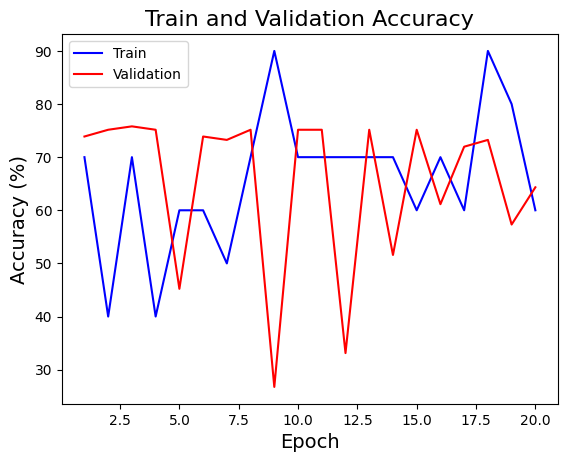

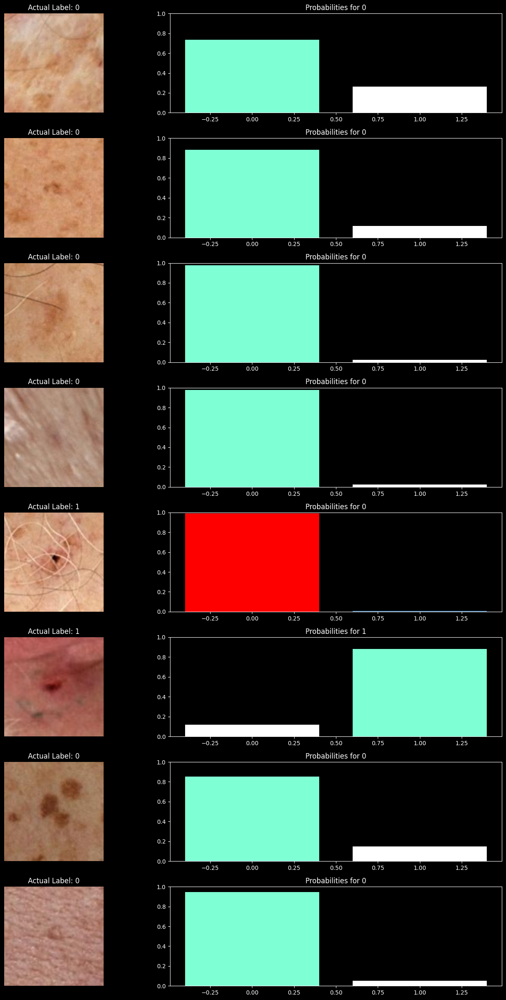

In [30]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
import random

# Load your ResNet50 model
Resnet50 = models.resnet50(pretrained=True)

# Freeze the layers
for param in Resnet50.parameters():
    param.requires_grad = False

# Replace the final fully connected layer
features = Resnet50.fc.in_features
Resnet50.fc = nn.Linear(features, 2)

# Set the device to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
Model = Resnet50.to(device)

# Define optimizer and loss function
optimizer = optim.SGD(Model.parameters(), lr=0.003, momentum=0.9)
criterion = nn.CrossEntropyLoss()

# Assume 'train_dl' is your training DataLoader
# Get the dataset from the DataLoader
train_dataset = train_dl.dataset

# Randomly select 10 images
indices = random.sample(range(len(train_dataset)), 10)
train_subset = torch.utils.data.Subset(train_dataset, indices)

# Create a new DataLoader with the subset
train_dl_reduced = torch.utils.data.DataLoader(train_subset, batch_size=2, shuffle=True)

# Train the model using the reduced dataset
train(Model, optimizer, criterion, train_dl_reduced, valid_dl, 20)
plot()
preds(Model)


# 2. **USED THE INCEPCTIONV3 WITH PYTORCH**

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:01<00:00, 85.0MB/s] 


Training the Epoch: 1
Epoch: [1/20], Loss: 0.2810, Train Acc: 80.00, Val Acc: 75.16
Training the Epoch: 2
Epoch: [2/20], Loss: 0.2184, Train Acc: 90.00, Val Acc: 75.16
Training the Epoch: 3
Epoch: [3/20], Loss: 0.1799, Train Acc: 90.00, Val Acc: 75.16
Training the Epoch: 4
Epoch: [4/20], Loss: 0.1521, Train Acc: 90.00, Val Acc: 75.16
Training the Epoch: 5
Epoch: [5/20], Loss: 0.1791, Train Acc: 90.00, Val Acc: 75.16
Training the Epoch: 6
Epoch: [6/20], Loss: 0.1051, Train Acc: 90.00, Val Acc: 75.16
Training the Epoch: 7
Epoch: [7/20], Loss: 0.1290, Train Acc: 90.00, Val Acc: 75.16
Training the Epoch: 8
Epoch: [8/20], Loss: 0.1058, Train Acc: 100.00, Val Acc: 75.16
Training the Epoch: 9
Epoch: [9/20], Loss: 0.1248, Train Acc: 90.00, Val Acc: 75.16
Training the Epoch: 10
Epoch: [10/20], Loss: 0.1086, Train Acc: 90.00, Val Acc: 75.16
Training the Epoch: 11
Epoch: [11/20], Loss: 0.0365, Train Acc: 100.00, Val Acc: 75.16
Training the Epoch: 12
Epoch: [12/20], Loss: 0.0858, Train Acc: 90.00,

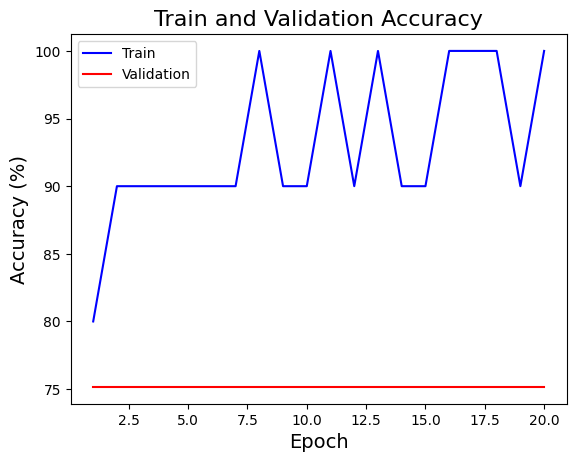

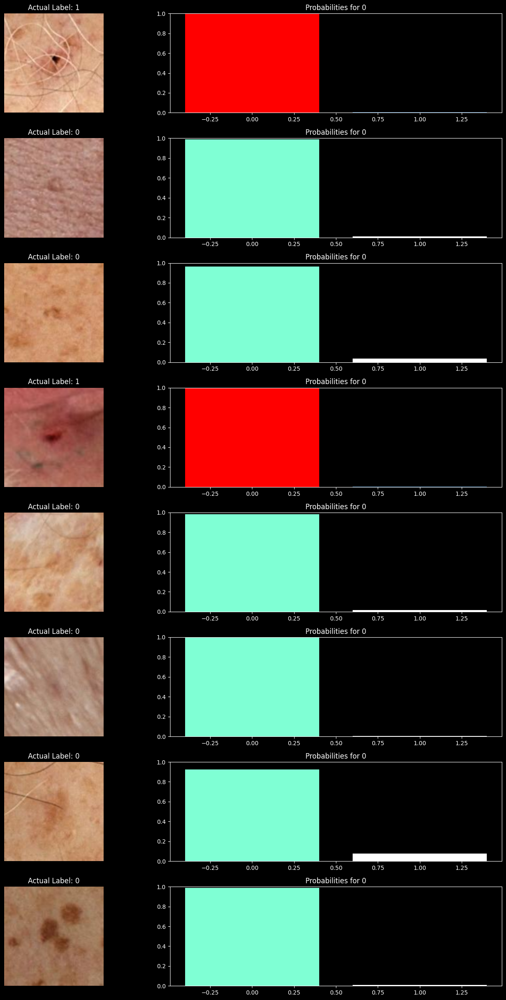

In [25]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
import random

# Load your ResNet50 model
Inception_v3 = models.inception_v3(pretrained=True)

# Freeze the layers
for param in Inception_v3.parameters():
    param.requires_grad = False

# Replace the final fully connected layer
features = Inception_v3.fc.in_features
Inception_v3.fc = nn.Linear(features, 2)

# Set the device to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
Model = Inception_v3.to(device)

# Define optimizer and loss function
optimizer = optim.SGD(Model.parameters(), lr=0.003, momentum=0.9)
criterion = nn.CrossEntropyLoss()

# Assume 'train_dl' is your training DataLoader
# Get the dataset from the DataLoader
train_dataset = train_dl.dataset

# Randomly select 10 images
indices = random.sample(range(len(train_dataset)), 10)
train_subset = torch.utils.data.Subset(train_dataset, indices)

# Create a new DataLoader with the subset
train_dl_reduced = torch.utils.data.DataLoader(train_subset, batch_size=2, shuffle=True)

# Train the model using the reduced dataset
train(Model, optimizer, criterion, train_dl_reduced, valid_dl, 20)
plot()
preds(Model)


# 3. **USED THE ALEXNET WITH PYTORCH**

Training the Epoch: 1
Epoch: [1/20], Loss: 0.4270, Train Acc: 90.00, Val Acc: 75.16
Training the Epoch: 2
Epoch: [2/20], Loss: 0.1761, Train Acc: 90.00, Val Acc: 36.31
Training the Epoch: 3
Epoch: [3/20], Loss: 0.4482, Train Acc: 80.00, Val Acc: 75.16
Training the Epoch: 4
Epoch: [4/20], Loss: 0.6500, Train Acc: 90.00, Val Acc: 75.16
Training the Epoch: 5
Epoch: [5/20], Loss: 0.2326, Train Acc: 90.00, Val Acc: 66.88
Training the Epoch: 6
Epoch: [6/20], Loss: 0.0327, Train Acc: 100.00, Val Acc: 47.13
Training the Epoch: 7
Epoch: [7/20], Loss: 0.3044, Train Acc: 90.00, Val Acc: 73.25
Training the Epoch: 8
Epoch: [8/20], Loss: 0.0000, Train Acc: 100.00, Val Acc: 75.16
Training the Epoch: 9
Epoch: [9/20], Loss: 0.3721, Train Acc: 90.00, Val Acc: 75.16
Training the Epoch: 10
Epoch: [10/20], Loss: 0.0000, Train Acc: 100.00, Val Acc: 73.89
Training the Epoch: 11
Epoch: [11/20], Loss: 0.0001, Train Acc: 100.00, Val Acc: 66.24
Training the Epoch: 12
Epoch: [12/20], Loss: 0.0070, Train Acc: 100.

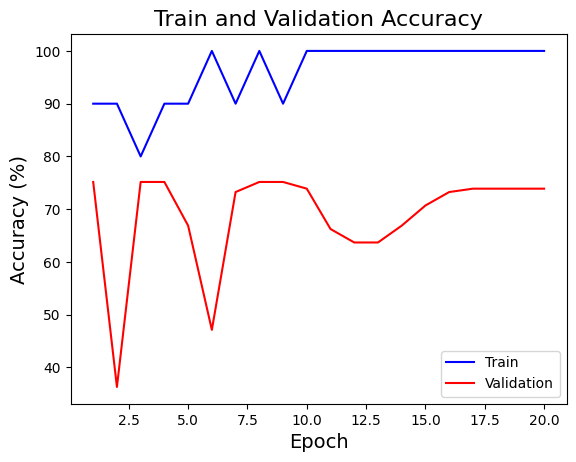

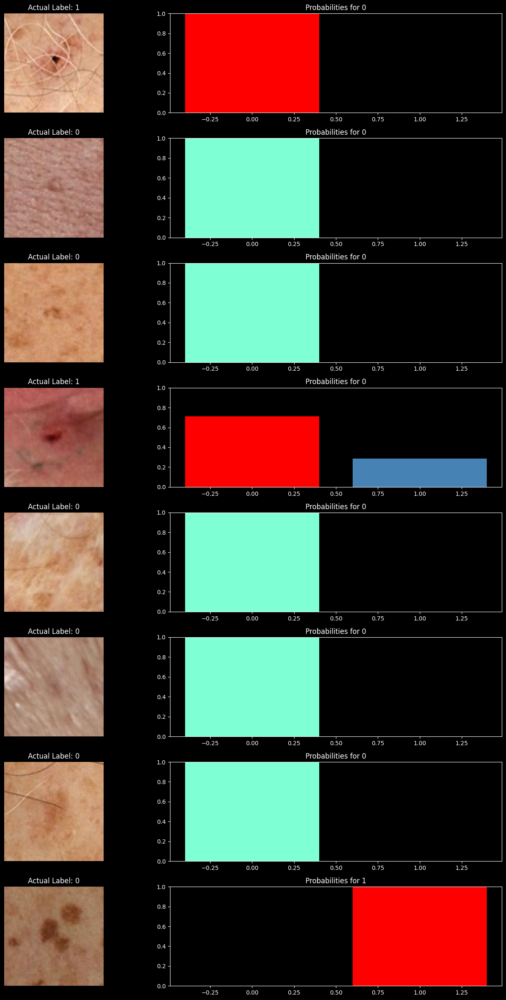

In [31]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
import random

# Load your AlexNet model
Alexnet = models.alexnet(pretrained=True)

# Freeze the layers
for param in Alexnet.parameters():
    param.requires_grad = False

# Replace the final fully connected layer in the classifier
features = Alexnet.classifier[6].in_features
Alexnet.classifier[6] = nn.Linear(features, 2)

# Set the device to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
Model = Alexnet.to(device)

# Define optimizer and loss function
optimizer = optim.SGD(Model.parameters(), lr=0.003, momentum=0.9)
criterion = nn.CrossEntropyLoss()

# Assume 'train_dl' is your training DataLoader
# Get the dataset from the DataLoader
train_dataset = train_dl.dataset

# Randomly select 10 images
indices = random.sample(range(len(train_dataset)), 10)
train_subset = torch.utils.data.Subset(train_dataset, indices)

# Create a new DataLoader with the subset
train_dl_reduced = torch.utils.data.DataLoader(train_subset, batch_size=2, shuffle=True)

# Train the model using the reduced dataset
train(Model, optimizer, criterion, train_dl_reduced, valid_dl, 20)

# Plot the training/validation loss or accuracy
plot()

# Make predictions with the trained model
preds(Model)


# 4. **USE THE VGG19 WITH PYTORCH**

Training the Epoch: 1
Epoch: [1/20], Loss: 0.2027, Train Acc: 80.00, Val Acc: 75.16
Training the Epoch: 2
Epoch: [2/20], Loss: 0.1284, Train Acc: 90.00, Val Acc: 75.16
Training the Epoch: 3
Epoch: [3/20], Loss: 0.0399, Train Acc: 100.00, Val Acc: 74.52
Training the Epoch: 4
Epoch: [4/20], Loss: 0.0254, Train Acc: 100.00, Val Acc: 72.61
Training the Epoch: 5
Epoch: [5/20], Loss: 0.0188, Train Acc: 100.00, Val Acc: 71.97
Training the Epoch: 6
Epoch: [6/20], Loss: 0.0070, Train Acc: 100.00, Val Acc: 72.61
Training the Epoch: 7
Epoch: [7/20], Loss: 0.0050, Train Acc: 100.00, Val Acc: 72.61
Training the Epoch: 8
Epoch: [8/20], Loss: 0.0019, Train Acc: 100.00, Val Acc: 72.61
Training the Epoch: 9
Epoch: [9/20], Loss: 0.0015, Train Acc: 100.00, Val Acc: 73.89
Training the Epoch: 10
Epoch: [10/20], Loss: 0.0025, Train Acc: 100.00, Val Acc: 73.89
Training the Epoch: 11
Epoch: [11/20], Loss: 0.0144, Train Acc: 100.00, Val Acc: 73.89
Training the Epoch: 12
Epoch: [12/20], Loss: 0.0032, Train Acc:

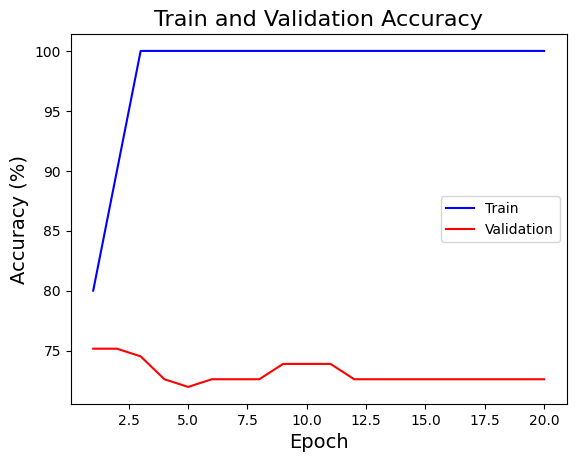

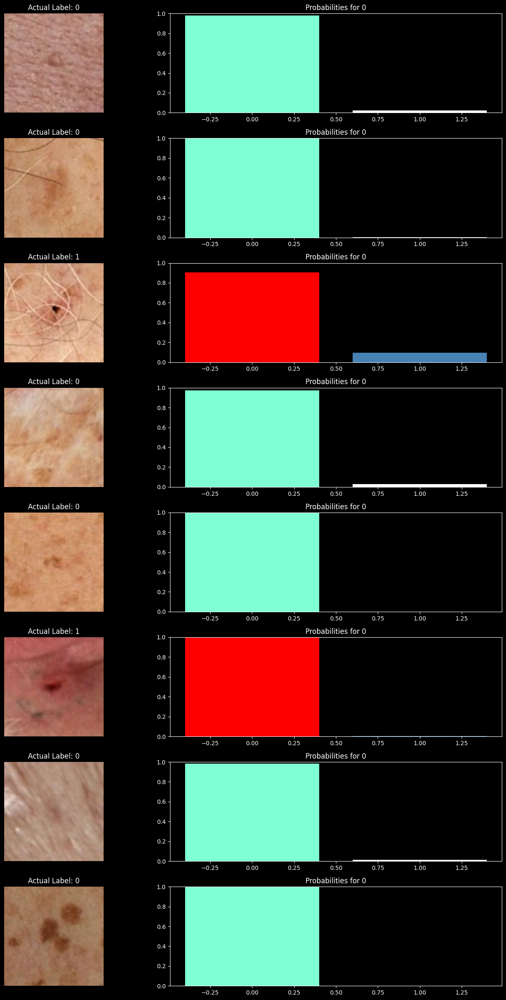

In [32]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
import random

# Load your VGG model
VGG = models.vgg16(pretrained=True)

# Freeze the layers
for param in VGG.parameters():
    param.requires_grad = False

# Replace the final fully connected layer in the classifier
features = VGG.classifier[6].in_features
VGG.classifier[6] = nn.Linear(features, 2)

# Set the device to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
Model = VGG.to(device)

# Define optimizer and loss function
optimizer = optim.SGD(Model.parameters(), lr=0.003, momentum=0.9)
criterion = nn.CrossEntropyLoss()

# Assume 'train_dl' is your training DataLoader
# Get the dataset from the DataLoader
train_dataset = train_dl.dataset

# Randomly select 10 images
indices = random.sample(range(len(train_dataset)), 10)
train_subset = torch.utils.data.Subset(train_dataset, indices)

# Create a new DataLoader with the subset
train_dl_reduced = torch.utils.data.DataLoader(train_subset, batch_size=2, shuffle=True)

# Train the model using the reduced dataset
train(Model, optimizer, criterion, train_dl_reduced, valid_dl, 20)

# Plot the training/validation loss or accuracy
plot()

# Make predictions with the trained model
preds(Model)


<p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:black; font-size:250%; text-align:left;padding: 0px; border-bottom: 3px solid red">Finaly Get ResNet50 with Pytorch</p>


# **ResNet50 Model Traning**

Training the Epoch: 1
Epoch: [1/20], Loss: 0.0173, Train Acc: 74.77, Val Acc: 74.52
Training the Epoch: 2
Epoch: [2/20], Loss: 0.0147, Train Acc: 80.38, Val Acc: 77.71
Training the Epoch: 3
Epoch: [3/20], Loss: 0.0135, Train Acc: 82.16, Val Acc: 79.62
Training the Epoch: 4
Epoch: [4/20], Loss: 0.0140, Train Acc: 80.60, Val Acc: 66.88
Training the Epoch: 5
Epoch: [5/20], Loss: 0.0154, Train Acc: 78.11, Val Acc: 70.06
Training the Epoch: 6
Epoch: [6/20], Loss: 0.0128, Train Acc: 82.16, Val Acc: 78.34
Training the Epoch: 7
Epoch: [7/20], Loss: 0.0128, Train Acc: 82.59, Val Acc: 80.89
Training the Epoch: 8
Epoch: [8/20], Loss: 0.0129, Train Acc: 81.66, Val Acc: 82.17
Training the Epoch: 9
Epoch: [9/20], Loss: 0.0121, Train Acc: 83.16, Val Acc: 80.89
Training the Epoch: 10
Epoch: [10/20], Loss: 0.0128, Train Acc: 81.95, Val Acc: 78.98
Training the Epoch: 11
Epoch: [11/20], Loss: 0.0123, Train Acc: 83.80, Val Acc: 79.62
Training the Epoch: 12
Epoch: [12/20], Loss: 0.0119, Train Acc: 83.23, V

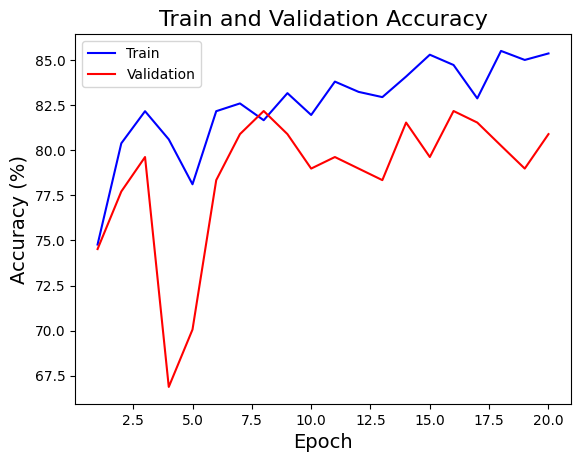

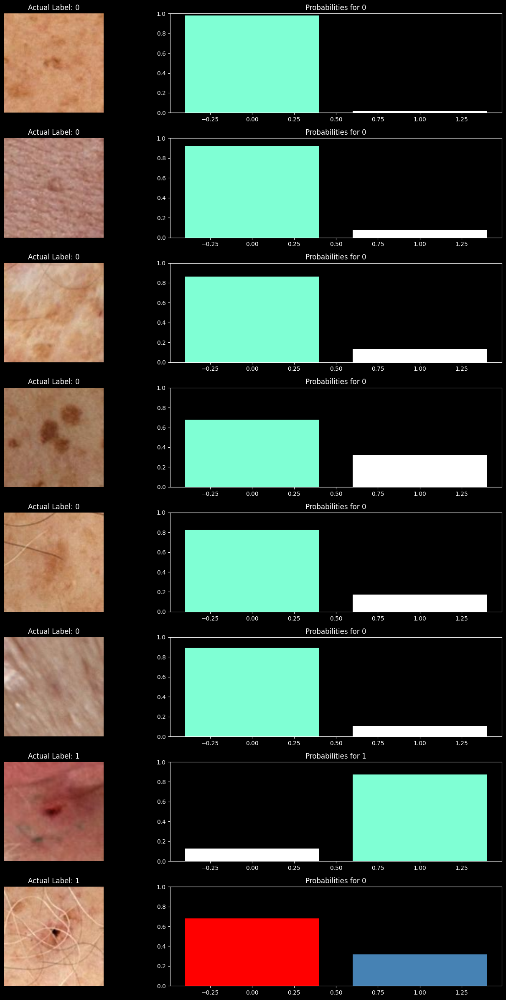

In [34]:
for param in Resnet50.parameters():
    param.requires_grad = False
    
features = Resnet50.fc.in_features
Resnet50.fc = nn.Linear(features, 2)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

Model = Resnet50.to(device)

optimizer = optim.SGD(Model.parameters(), lr = 0.003, momentum = 0.9)
criterion = nn.CrossEntropyLoss()

train(Model, optimizer, criterion, train_dl, valid_dl, 20)
plot()
preds(Model)


In [43]:
import torch

# Save the model's state dictionary to a file
model_save_path = '/kaggle/working/train.pth'
torch.save(Model.state_dict(), model_save_path)


# <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:black; font-size:130%; text-align:left;padding: 0px; border-bottom: 3px solid red">Testing</p>

# Whita box testing

In [44]:
import torch
import torch.nn as nn

def test_layer_shapes(model):
    """
    Test the shapes of the outputs at different layers.
    """
    # Define a dummy input
    dummy_input = torch.randn(1, 3, 299, 299)  # Batch size of 1, 3 channels, 299x299 image
    
    def hook_fn(module, input, output):
        print(f"Layer: {module.__class__.__name__}, Output Shape: {output.shape}")

    hooks = []
    for name, module in model.named_modules():
        hook = module.register_forward_hook(hook_fn)
        hooks.append(hook)

    # Perform a forward pass
    model(dummy_input)

    # Remove hooks
    for hook in hooks:
        hook.remove()

test_layer_shapes(Resnet50)

Layer: Conv2d, Output Shape: torch.Size([1, 64, 150, 150])
Layer: BatchNorm2d, Output Shape: torch.Size([1, 64, 150, 150])
Layer: ReLU, Output Shape: torch.Size([1, 64, 150, 150])
Layer: MaxPool2d, Output Shape: torch.Size([1, 64, 75, 75])
Layer: Conv2d, Output Shape: torch.Size([1, 64, 75, 75])
Layer: BatchNorm2d, Output Shape: torch.Size([1, 64, 75, 75])
Layer: ReLU, Output Shape: torch.Size([1, 64, 75, 75])
Layer: Conv2d, Output Shape: torch.Size([1, 64, 75, 75])
Layer: BatchNorm2d, Output Shape: torch.Size([1, 64, 75, 75])
Layer: ReLU, Output Shape: torch.Size([1, 64, 75, 75])
Layer: Conv2d, Output Shape: torch.Size([1, 256, 75, 75])
Layer: BatchNorm2d, Output Shape: torch.Size([1, 256, 75, 75])
Layer: Conv2d, Output Shape: torch.Size([1, 256, 75, 75])
Layer: BatchNorm2d, Output Shape: torch.Size([1, 256, 75, 75])
Layer: Sequential, Output Shape: torch.Size([1, 256, 75, 75])
Layer: ReLU, Output Shape: torch.Size([1, 256, 75, 75])
Layer: Bottleneck, Output Shape: torch.Size([1, 256,

# Black Box Testing

In [45]:
def black_box_test(model, test_loader, criterion):
    """
    Perform black box testing by evaluating the model on the test set.
    """
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    accuracy = 100 * correct / total
    print(f"Test Loss: {total_loss / len(test_loader):.4f}, Test Accuracy: {accuracy:.2f}%")

black_box_test(Resnet50, test_dl, nn.CrossEntropyLoss())


Test Loss: 0.2762, Test Accuracy: 87.50%


# Gray Box Testing

In [46]:
def gray_box_test(model, test_loader, criterion):
    """
    Perform gray box testing combining both internal checks and functional evaluation.
    """
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    
    def hook_fn(module, input, output):
        if isinstance(module, nn.Linear):  # Check linear layers specifically
            print(f"Linear Layer Output Shape: {output.shape}")

    hooks = [module.register_forward_hook(hook_fn) for name, module in model.named_modules()]
    
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    accuracy = 100 * correct / total
    print(f"Test Loss: {total_loss / len(test_loader):.4f}, Test Accuracy: {accuracy:.2f}%")
    
    for hook in hooks:
        hook.remove()

gray_box_test(Resnet50, test_dl, nn.CrossEntropyLoss())


Linear Layer Output Shape: torch.Size([8, 2])
Test Loss: 0.2762, Test Accuracy: 87.50%


# Intigration Testing

In [48]:
def integration_test(model, train_dl, valid_dl):
    """
    Integration test to ensure end-to-end pipeline works.
    """
    optimizer = optim.SGD(model.parameters(), lr=0.003, momentum=0.9)
    criterion = nn.CrossEntropyLoss()
    
    # Train the model
    train(model, optimizer, criterion, train_dl, valid_dl, epochs=1)
    
    # Validate the model
    black_box_test(model, valid_dl, criterion)

integration_test(Resnet50, train_dl, valid_dl)


Training the Epoch: 1
Epoch: [1/1], Loss: 0.0114, Train Acc: 83.94, Val Acc: 75.80
Test Loss: 0.5508, Test Accuracy: 75.80%


# System Testing

In [49]:
def system_test(model, train_dl, valid_dl, test_dl):
    """
    System test to evaluate end-to-end functionality.
    """
    optimizer = optim.SGD(model.parameters(), lr=0.003, momentum=0.9)
    criterion = nn.CrossEntropyLoss()
    
    # Train the model
    train(model, optimizer, criterion, train_dl, valid_dl, epochs=5)
    
    # Validate the model
    black_box_test(model, valid_dl, criterion)
    
    # Test the model
    black_box_test(model, test_dl, criterion)

system_test(Resnet50, train_dl, valid_dl, test_dl)

Training the Epoch: 1
Epoch: [1/5], Loss: 0.0110, Train Acc: 85.00, Val Acc: 78.98
Training the Epoch: 2
Epoch: [2/5], Loss: 0.0105, Train Acc: 85.50, Val Acc: 81.53
Training the Epoch: 3
Epoch: [3/5], Loss: 0.0105, Train Acc: 84.72, Val Acc: 79.62
Training the Epoch: 4
Epoch: [4/5], Loss: 0.0106, Train Acc: 85.93, Val Acc: 81.53
Training the Epoch: 5
Epoch: [5/5], Loss: 0.0113, Train Acc: 84.72, Val Acc: 80.25
Test Loss: 0.4744, Test Accuracy: 80.25%
Test Loss: 0.2714, Test Accuracy: 87.50%


# Load Testing

In [50]:
def load_test(model, test_loader):
    """
    Perform load testing by evaluating the model's performance under a heavy load.
    """
    import time
    start_time = time.time()
    black_box_test(model, test_loader, nn.CrossEntropyLoss())
    end_time = time.time()
    print(f"Load Testing Duration: {end_time - start_time:.2f} seconds")

load_test(Resnet50, test_dl)


Test Loss: 0.2714, Test Accuracy: 87.50%
Load Testing Duration: 2.00 seconds


# Stress Testing

In [51]:
def stress_test(model, test_loader):
    """
    Perform stress testing by evaluating the model with unusually large input data.
    """
    # Simulate stress by increasing batch size or input size
    stress_loader = DataLoader(test_ds, batch_size=128, shuffle=False)
    black_box_test(model, stress_loader, nn.CrossEntropyLoss())

stress_test(Resnet50, test_dl)


Test Loss: 0.2714, Test Accuracy: 87.50%


# Sacalbility Testing

In [52]:
def scalability_test(model, test_loader):
    """
    Perform scalability testing by evaluating the model with increasing data sizes.
    """
    # Increasing the data size (if feasible)
    for batch_size in [32, 64, 128]:
        loader = DataLoader(test_ds, batch_size=batch_size, shuffle=False)
        print(f"Testing with batch size: {batch_size}")
        black_box_test(model, loader, nn.CrossEntropyLoss())

scalability_test(Resnet50, test_dl)


Testing with batch size: 32
Test Loss: 0.2714, Test Accuracy: 87.50%
Testing with batch size: 64
Test Loss: 0.2714, Test Accuracy: 87.50%
Testing with batch size: 128
Test Loss: 0.2714, Test Accuracy: 87.50%


# Userbility Testing

In [54]:
def usability_test(model, test_loader):
    """
    Perform usability testing by evaluating the model and checking if outputs are practical.
    """
    model.eval()
    with torch.no_grad():
        for images, labels in test_loader:
            outputs = model(images)
            probabilities = torch.nn.functional.softmax(outputs, dim=1)
            print(f"Probabilities: {probabilities.mean(dim=0)}")  # Check if outputs are reasonable
            break  # Just testing a sample

usability_test(Resnet50, test_dl)


Probabilities: tensor([0.7941, 0.2059])


# Compatibility Testing

In [55]:
def compatibility_test(model, test_loader):
    """
    Perform compatibility testing by running the model on different devices (CPU/GPU).
    """
    devices = ['cuda:0' if torch.cuda.is_available() else 'cpu', 'cpu']
    for device in devices:
        print(f"Testing on device: {device}")
        model = Resnet50.to(device)
        black_box_test(model, test_loader, nn.CrossEntropyLoss())

compatibility_test(Resnet50, test_dl)


Testing on device: cpu
Test Loss: 0.2714, Test Accuracy: 87.50%
Testing on device: cpu
Test Loss: 0.2714, Test Accuracy: 87.50%


# **Other Testings**

# Smoke Testing

In [56]:
def smoke_test(model, test_loader):
    """
    Perform smoke testing to verify basic functionality.
    """
    model.eval()
    try:
        black_box_test(model, test_loader, nn.CrossEntropyLoss())
        print("Smoke Test Passed")
    except Exception as e:
        print(f"Smoke Test Failed: {e}")

smoke_test(Resnet50, test_dl)

Test Loss: 0.2714, Test Accuracy: 87.50%
Smoke Test Passed


# Sanity Testing

In [57]:
def sanity_test(model, test_loader):
    """
    Perform sanity testing to verify the functionality of a specific feature.
    """
    model.eval()
    # Assuming bug fix related to output shapes
    try:
        black_box_test(model, test_loader, nn.CrossEntropyLoss())
        print("Sanity Test Passed")
    except Exception as e:
        print(f"Sanity Test Failed: {e}")

sanity_test(Resnet50, test_dl)


Test Loss: 0.2714, Test Accuracy: 87.50%
Sanity Test Passed


# Regression Testng

In [58]:
def regression_test(model, test_loader):
    """
    Perform regression testing to ensure that recent changes did not break existing functionality.
    """
    model.eval()
    # Testing on a set of known results
    try:
        black_box_test(model, test_loader, nn.CrossEntropyLoss())
        print("Regression Test Passed")
    except Exception as e:
        print(f"Regression Test Failed: {e}")

regression_test(Resnet50, test_dl)


Test Loss: 0.2714, Test Accuracy: 87.50%
Regression Test Passed


# Acceptance Testing

In [59]:
def acceptance_test(model, test_loader):
    """
    Perform acceptance testing to ensure the model meets the defined requirements.
    """
    model.eval()
    # Check if model meets predefined criteria
    try:
        black_box_test(model, test_loader, nn.CrossEntropyLoss())
        print("Acceptance Test Passed")
    except Exception as e:
        print(f"Acceptance Test Failed: {e}")

acceptance_test(Resnet50, test_dl)


Test Loss: 0.2714, Test Accuracy: 87.50%
Acceptance Test Passed


# User Acceptace Testing(UAT)

In [60]:
def user_acceptance_test(model, test_loader):
    """
    Perform user acceptance testing by getting feedback from actual users.
    """
    model.eval()
    # Simulating user interaction
    try:
        for images, labels in test_loader:
            outputs = model(images)
            print(f"User Acceptance Test - Predicted: {torch.argmax(outputs, dim=1)}")
            break  # Testing with a sample
        print("User Acceptance Test Passed")
    except Exception as e:
        print(f"User Acceptance Test Failed: {e}")

user_acceptance_test(Resnet50, test_dl)


User Acceptance Test - Predicted: tensor([0, 0, 0, 1, 0, 0, 0, 0])
User Acceptance Test Passed
